Plan:
Import ranking data for each NYC school district using school digger.

Info available:

Detailed record for one district:
Number of schools by type (elementary, high)
Number of students
number of teachers and what level
rank
mean standardized test scores as compared to district, state


In [49]:
from pprint import pprint
import numpy as np
import pandas as pd
import requests as req
import json

In [50]:
#Get list of NYC school districts from school digger API for district list
#School digger api credentials

#Lists of all NYC zip codes obtained from health.ny.gov 
NYC_zips = [10455, 10459, 10474, 10463, 10471, 10466, 10469, 10470, 10475, 10461, 10453, 10457, 
            10460, 10458, 10467, 10468, 10451, 10452, 10456, 10454, 10462,10464, 10465, 10472, 
            10473, 11212, 11213, 11216, 11233, 11238, 11209, 11214, 11228, 11204, 11218,
            11219, 11230, 11234, 11236, 11239, 11223, 11224, 11229, 11235, 11201,
            11205, 11215, 11217, 11231, 11203, 11210, 11225, 11226, 11207, 11208,
            11211, 11222, 11220, 11232, 11206, 11221, 11237, 10026, 10027, 10030,
            10037, 10039, 10001, 10011, 10018, 10019, 10020, 10036, 10029, 10035, 10010, 
            10016, 10017, 10022, 10012, 10013, 10014, 10004, 10005, 10006, 10007, 10038, 
            10280, 10002, 10003, 10009, 10021,10028, 10044, 10065, 10075, 10128, 10023, 10024, 10025, 10031, 10032,
            10033, 10034, 10040, 11361, 11362, 11363, 11364, 11354, 11355, 11356, 11357, 11358, 11359,
            11360, 11365, 11366, 11367, 11412, 11423, 11432, 11433, 11434, 11435, 11436, 11101, 
            11102, 11103, 11104, 11105, 11106, 11374, 11375, 11379, 11385, 11691, 11692, 11693, 
            11694, 11695, 11697, 11004, 11005, 11411, 11413, 11422, 11426, 11427, 11428, 11429, 
            11414, 11415, 11416, 11417, 11418, 11419, 11420, 11421, 11368, 11369, 11370, 11372, 
            11373, 11377, 11378, 10302, 10303, 10310, 10306, 10307, 10308, 10309, 10312, 10301, 10304, 10305, 10314]

In [51]:
url_list= []

#Loop through list of boros to create request url's
for zipcode in NYC_zips:
    target_url = "https://api.schooldigger.com/v1.1/districts?st=NY&zip=%s&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47" % (zipcode)
    print(target_url)
    url_list.append(target_url)

https://api.schooldigger.com/v1.1/districts?st=NY&zip=10455&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10459&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10474&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10463&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10471&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10466&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10469&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10470&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47
https://api.schooldigger.com/v1.1/districts?st=NY&zip=10475&appID=6c0fc6b7&appKe

In [52]:
#Create request for each url
request_list = []
for url in url_list:
    response = req.get(url).json()
    request_list.append(response)

In [18]:
#Get list of district id's
district_ids = []
for request in request_list:
        for district in request["districtList"]:
            district_id = district["districtID"]
            district_ids.append(district_id)
        
#Get list of boros to correspond with ids
district_boros = []
for request in request_list:
        for district in request["districtList"]:
            boro = district["address"]["city"]
            district_boros.append(boro)
        
#Concat lists in a dataframe
district_list = pd.DataFrame({"Boro": district_boros, "District ID": district_ids})

,Boro,District ID
0,Bronx,3600986
1,Bronx,3601073
2,Bronx,3601131
3,Bronx,3600963
4,Bronx,3600111
5,Bronx,3600090
6,Bronx,3601067
7,Bronx,3600161
8,Bronx,3600063
9,Bronx,3600165


In [53]:
#Get ranking/test score info for each school district in the district list
#School digger api credentials
appid = "6c0fc6b7"
apikey = "c9afc046a1198a993222f9b6107ffb47"

district_details = []

for district in district_list["District ID"]:
    target_url = "https://api.schooldigger.com/v1.1/districts/%s?appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47" % (district)
    response = req.get(target_url).json()
    district_details.append(response)

In [30]:
pprint(district_details)

[{'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '681 Kelly St-Rm 205<br />Bronx, NY 10455-3410',
              'latLong': {'latitude': 40.815457, 'longitude': -73.902117},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '681 Kelly St-Rm 205',
              'zip': '10455',
              'zip4': '3410',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10455/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3600986',
  'districtName': 'Girls Preparatory Charter School Of The Bronx',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 2.0,
                             'numberOfEnglishLanguageLearnerStudents': 36,
                             'numberOfGuidanceElem': 0.0,
           

                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 216,
                             'numberOfTeachers': 17.0,
                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 17.0,
                             'y

                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 4.5,
                             'year': 2011},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 34,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'num

                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 227043},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 48.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 5.0,
                                        'studentsTested'

                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 191,
                                        'numTier2': 139,
                                        'numTier3': 219,
                                        'numTier4': 12,
                                        'percentMetStandard': 41.18,
                                        'percentTier1': 34.05,
                                        'percentTier2': 24.78,
                                        'percentTier3': 39.04,
                                        'percentTier4': 2.14,
                                        'studentsTested': 561},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6831,
                                     'numTier2': 5701,
                                     'numTier3': 12064,
                                     'numTier4': 2306,
                                     'percentMetStandard': 53.42

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 35.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1508},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 232125},
                  'subject': 'Living Envi

                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 19.0,
                                        'percentTier1': 59.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 75},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 109414},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
  

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 27.0,
                                        'percentTier2': 25.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2583},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283446},
                  'subject': 'Integrated Algebra',
                  'test': 

                                        'percentTier3': 28.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 1769},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 196499},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': 

                 {'districtTestScore': {'meanScaledScore': 649.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 43.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1848},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 667.0,
                                     'percentMetStandard': 78.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 72.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 197893},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessm

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 281.0,
                                        'numTier1': 811,
                                        'numTier2': 594,
                                        'numTier3': 142,
                                        'numTier4': 87,
                                        'percentMetStandard': 14.01,
                                        'percentTier1': 49.63,
                                        'percentTier2': 36.35,
                                        'percentTier3': 8.69,
                                        'percentTier4': 5.32,
                                        'studentsTested': 1634},
          

                  'stateTestScore': {'meanScaledScore': 685.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 199462},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 672.0,
                                        'percentMetStandard': 80.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 15.0,
                    

                                     'studentsTested': 202595},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 45.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 1877},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 66.0,
                                 

                  'stateTestScore': {'percentMetStandard': 34.8,
                                     'percentTier1': 33.6,
                                     'percentTier2': 31.6,
                                     'percentTier3': 22.8,
                                     'percentTier4': 12.0},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 285.0,
                                        'numTier1': 909,
                                        'numTier2': 486,
                                        'numTier3': 210,
                                        'numTier4': 61,
                                        'percentMetStandard': 17.0,
                                        '

                 {'districtTestScore': {'meanScaledScore': 54.0,
                                        'percentMetStandard': 26.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1836},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 191162},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
       

                                     'studentsTested': 79554},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 350,
                                        'numTier2': 222,
                                        'numTier3': 564,
                                        'numTier4': 307,
                                        'numTier5': 277,
                                        'percentMetStandard': 33.95,
                                        'percentTier1': 20.35,
                                        'percentTier2': 12.91,
                                        'perc

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 313,
                 

                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 192

                             'numberOfTeachersElementary': 6.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 7.0,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminS

  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 11.0,
                             'numberOfEnglishLanguageLearnerStudents': 4023,
                             'numberOfGuidanceElem': 30.5,
                             'numberOfGuidanceSecondary': 77.0,
                             'numberOfGuidanceTotal': 107.5,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 7.5,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 33.0,
                             'numberOfSchoolAdministrators': 195.0,
                             'numberOfSpecialEdStudents': 10328,
                             'numberOfStudentSupportStaff': 113.0,
                             'numberOfStudents': 4020

                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 63.0,
                                        'studentsTested': 30},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 69.0,
                                     'studentsTested': 18503},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
       

                                     'studentsTested': 231982},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 32.0,
                                        'percentTier1': 47.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 3566},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 63.0,
                                     'percentTier1': 23.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 39.0,
  

                 {'districtTestScore': {'percentMetStandard': 60.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 3355},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 236323},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4

                                     'numTier4': 22432,
                                     'percentMetStandard': 75.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 103194},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 134,
                                        'numTier2': 147,
                                        'numTier3': 121,
                                        'numTier4': 10,
                                        'percentMetStandard': 31.8,
                         

                                        'percentTier3': 44.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1369},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 22015,
                                     'numTier2': 20941,
                                     'numTier3': 74940,
                                     'numTier4': 33366,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 151262},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
  

                                        'studentsTested': 3098},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 674.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 195176},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'percentMetStandard': 20.0,
                              

                                        'percentTier4': 7.0,
                                        'studentsTested': 2858},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'numTier1': 41797,
                                     'numTier2': 58224,
                                     'numTier3': 30840,
                                     'numTier4': 21569,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 38.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 152430},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below 

                                     'percentTier4': 26.0,
                                     'studentsTested': 197256},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 684.0,
                                        'percentMetStandard': 90.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 71.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 3189},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 692.0,
                                     'per

                                     'studentsTested': 198878},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'percentMetStandard': 22.0,
                                        'percentTier1': 49.0,
                                        'percentTier2': 30.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 3167},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 30.0,
                                  

                                     'numTier3': 31284,
                                     'numTier4': 19738,
                                     'percentMetStandard': 36.0,
                                     'percentTier1': 34.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 142103},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 294.0,
                                        'numTier1': 1264,
                                        'numTier2': 972,
                                        'numTi

                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 186513},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'percentMetStandard': 36.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 45.0,
                  

                                     'numTier2': 12581,
                                     'numTier3': 42755,
                                     'numTier4': 32857,
                                     'numTier5': 102790,
                                     'percentMetStandard': 65.48,
                                     'percentTier1': 7.81,
                                     'percentTier2': 6.07,
                                     'percentTier3': 20.64,
                                     'percentTier4': 15.86,
                                     'percentTier5': 49.62,
                                     'studentsTested': 207161},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  '

                   'rankStars': 4,
                   'rankStatewidePercentage': 76.86,
                   'year': 2012}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00955/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '1500 Pelham Pkwy South<br />Bronx, NY 10461',
              'latLong': {'latitude': 40.8571, 'longitude': -73.843669},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '1500 Pelham Pkwy South',
              'zip': '10461',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10461/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3600995',
  'districtName': 'Icahn Charter School 4',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
               

                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 249,
                             'numberOfTeachers': 31.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                

                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 176,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': 9.7,
     

                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 235160},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 7022},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 65.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 6095},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 83.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 227616},
                  'subject': 'English',
 

                                        'numTier2': 476,
                                        'numTier3': 1708,
                                        'numTier4': 1725,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 38.0,
                                        'studentsTested': 4490},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 18472,
                                     'numTier2': 16860,
                                     'numTier3': 78014,
                                     'numTier4': 102532,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 8.0,
       

                                        'percentTier4': 9.81,
                                        'studentsTested': 1712},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24480,
                                     'numTier2': 20748,
                                     'numTier3': 59309,
                                     'numTier4': 50746,
                                     'percentMetStandard': 70.87,
                                     'percentTier1': 15.76,
                                     'percentTier2': 13.36,
                                     'percentTier3': 38.19,
                                     'percentTier4': 32.68,
                                     'studentsTested': 155283},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
               

                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 51049},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 79,
                                        'numTier2': 75,
                                        'numTier3': 358,
                                        'numTier4': 571,
                                        'percentMetStandard': 86.0,
                                        'percentTier1': 7.0,
                        

                 {'districtTestScore': {'percentMetStandard': 59.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 2013},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 116469},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  '

                                        'percentMetStandard': 39.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 3812},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 674.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 195176},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
      

                 {'districtTestScore': {'meanScaledScore': 655.0,
                                        'percentMetStandard': 35.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 3938},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 2.0,
                                     'studentsTested': 200547},
                  'subject': 'English Language Arts',
                  'test': 'NY State Asses

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'numTier1': 1447,
                                        'numTier2': 1433,
                                        'numTier3': 630,
                                        'numTier4': 113,
                                        'percentMetStandard': 20.5,
                                        'percentTier1': 39.9,
                                        'percentTier2': 39.6,
                                        'percentTier3': 17.4,
                                        'percentTier4': 3.1,
                                        'studentsTested': 1447},
                  'grade': '8',
                  'stateTestScore': {'percentMetStandard': 34.7,
                  

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 688.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 199327},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 57.0,
                                        'percentTier1': 9.0,
                                        'percentTi

                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 288.0,
                                        'numTier1': 1647,
                                        'numTier2': 1325,
                                        'numTier3': 502,
                                        'numTier4': 319,
                                        'percentMetStandard': 21.6,
                                        'percentTier1': 43.4,
                                        'percentTier2': 34.9,
                                        'percentTier3': 13.2,
                                        'percentTier4': 8.4,
                                        'studentsTested': 1647},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 38.8,
                                     'percentTier1': 28.4,
                                     'percentTier2': 32.7,
                                     'pe

                                     'numTier4': 6545,
                                     'percentMetStandard': 21.59,
                                     'percentTier1': 41.41,
                                     'percentTier2': 37.0,
                                     'percentTier3': 15.38,
                                     'percentTier4': 6.21,
                                     'studentsTested': 105469},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 69.0,
                                        'percentMetStandard': 64.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 28.0,
                         

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'numTier1': 767,
                                        'numTier2': 1599,
                                        'numTier3': 1216,
                                        'numTier4': 174,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 43.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 3756},
                  'grade':

                                        'studentsTested': 2879},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 28233,
                                     'numTier2': 31461,
                                     'numTier3': 64756,
                                     'numTier4': 18123,
                                     'numTier5': 20475,
                                     'percentMetStandard': 23.67,
                                     'percentTier1': 17.32,
                                     'percentTier2': 19.3,
                                     'percentTier3': 39.72,
                                     'percentTier4': 11.12,
                                     'percentTier5': 12.56,
                                     'studentsTested': 163048},
                  'subject': 'Geometry',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'D

                   'rankStars': 3,
                   'rankStatewidePercentage': 52.49,
                   'year': 2016},
                  {'rank': 470,
                   'rankOf': 752,
                   'rankScore': 0.4973329,
                   'rankStars': 2,
                   'rankStatewidePercentage': 37.5,
                   'year': 2015},
                  {'rank': 416,
                   'rankOf': 747,
                   'rankScore': 0.5488069,
                   'rankStars': 2,
                   'rankStatewidePercentage': 44.31,
                   'year': 2014},
                  {'rank': 512,
                   'rankOf': 719,
                   'rankScore': 0.44814,
                   'rankStars': 1,
                   'rankStatewidePercentage': 28.79,
                   'year': 2013},
                  {'rank': 299,
                   'rankOf': 700,
                   'rankScore': 0.6489921,
                   'rankStars': 3,
                   'rankStatewidePercentage'

                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2005},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'num

                                     'percentTier4': 67.0,
                                     'studentsTested': 83495},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 96.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 63.0,
                                        'studentsTested': 577},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                            

                                     'percentTier2': 10.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 46.0,
                                     'studentsTested': 202959},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1609},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
         

                                     'studentsTested': 165230},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 46.0,
                                        'percentTier1': 32.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 506},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                  

                  'grade': '13',
                  'stateTestScore': {'numTier1': 4616,
                                     'numTier2': 5010,
                                     'numTier3': 22679,
                                     'numTier4': 18983,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 51288},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 4,
                                        'numTier2': 1,
              

                                        'numTier2': 35,
                                        'numTier3': 49,
                                        'numTier4': 1,
                                        'percentMetStandard': 42.74,
                                        'percentTier1': 27.35,
                                        'percentTier2': 29.91,
                                        'percentTier3': 41.88,
                                        'percentTier4': 0.85,
                                        'studentsTested': 117},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 677,
                                     'percentMetStandard': 37.55,
                                     'percentTier1': 33.04,
                                     'percentTier2': 29.41,
           

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 278.0,
                                        'numTier1': 757,
                                        'numTier2': 408,
                                        'numTier3': 135,
                                        'numTier4': 14,
                                        'percentMetStandard': 11.0,
                                        'percentTier1': 58.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 10.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1314},
              

                                        'studentsTested': 631},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 30.6,
                                     'percentTier1': 30.6,
                                     'percentTier2': 38.8,
                                     'percentTier3': 16.2,
                                     'percentTier4': 14.4},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 284.0,
                                        'numTier1': 497,
                                        'numTier2': 478,
                                        'numTier3': 136,
                                        'numTier4': 

                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 658.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 42.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 2.0,
                                     'studentsTested': 199190},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 275.0,
                                        'percentMetStandard': 9.0,
                                        'percentTier1': 57.0,
                                  

                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 73.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 16.0,
                                        'studentsTested': 1322},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 689.0,
                                     'percentMetStandard': 87.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 197561},
                  'subject': 'Math',
                  'test':

                                        'percentTier3': 27.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1393},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 682.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 200292},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore'

                                     'percentTier1': 31.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 198213},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 274.0,
                                        'numTier1': 785,
                                        'numTier2': 368,
                                        'numTier3': 81,
                                        'numTier4': 18,
                                        'percentMetStandard': 7.0,
                                        'perce

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'percentMetStandard': 33.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 48.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1368},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 7.0,
                                     'p

                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 309,
                                        'numTier2': 246,
                                        'numTier3': 641,
                                        'numTier4': 317,
                                        'numTier5': 382,
                                        'percentMetStandard': 36.89,
                                        'percentTier1': 16.31,
                                        'percentTier2': 12.98,
                                        'percentTier3': 33.83,
                                        'percentTier4': 16.73,
                                        'percentTier5': 20.16,
                                        'studentsTested': 1895},
                 

                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 17.0,
                             'numberOfTeachersElementary': 12.0,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 1.0,
                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 1,
                             'numberOf

                             'year': 2016}],
  'highGrade': '2',
  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(347) 735-5480',
  'rankHistory': None,
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01129/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '800 Home St-Rm 205<br />Bronx, NY 10456',
              'latLong': {'latitude': 40.82708, 'longitude': -73.900601},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '800 Home St-Rm 205',
              'zip': '10456',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10456/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/se

                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 3.0,
                             'numberOfSchoolAdministrators': 2.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 2.0,
                             'numberOfStudents': 247,
                             'numberOfTeachers': 23.8,
                             'numberOfTeachersElementary': 7.0,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 16.8,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numb

                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 13.5,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': 17.3,
                             'numberOfSchoolAdminSupportStaff': 65.5,
                             'numberOfSchoolAdministrators': 181.5,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 122.3,
                             'numberOfStudents': None,
                             'numberOfTeachers': 2579.0,
                             'numberOfTeachersElementary': 1017.3,
                             'numberOfTeachersK': 174.3,
                             'numberOfTeachersPK': 71.8,
                             'numberOfTeachersSecondary': 731.0,
                             'year': 2008},
                            {'numberOfAids': None,
                             'number

                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 91.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 36.0,
                                        'studentsTested': 22},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 56.0,
                                     'studentsTested': 17680},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
         

                                        'percentTier2': 18.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2911},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 51860,
                                     'numTier2': 31762,
                                     'numTier3': 91736,
                                     'numTier4': 71789,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 247147},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-

                                        'percentTier4': 5.34,
                                        'studentsTested': 2884},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30555,
                                     'numTier2': 31585,
                                     'numTier3': 111830,
                                     'numTier4': 67368,
                                     'percentMetStandard': 74.25,
                                     'percentTier1': 12.66,
                                     'percentTier2': 13.09,
                                     'percentTier3': 46.34,
                                     'percentTier4': 27.91,
                                     'studentsTested': 241338},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
         

                                     'percentMetStandard': 74.04,
                                     'percentTier1': 8.94,
                                     'percentTier2': 17.02,
                                     'percentTier3': 50.85,
                                     'percentTier4': 23.19,
                                     'studentsTested': 105639},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 85.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 85.0,
                                        'percentTier4': 0.0,
                                        'studentsTested':

                                        'percentTier3': 41.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1087},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162505},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 48.0,
                                        'percentTier1': 34.0,
                         

                                        'percentTier2': 35.0,
                                        'percentTier3': 20.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2919},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 170304},
                  'subject': 'English Language Arts',
             

                                     'percentTier1': 35.3,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'numTier1': 1450,
                                        'numTier2': 812,
                                        'numTier3': 403,
                                        'numTier4': 102,
                                        'percentMetStandard': 19.0,
                                        'percentTier1': 52.0,
                          

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 626.0,
                                        'percentMetStandard': 24.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 55.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 3113},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 650.0,
                                     'percentMetStandard': 49.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 41.0,
                  

                                     'numTier1': 51299,
                                     'numTier2': 58945,
                                     'numTier3': 49938,
                                     'numTier4': 30441,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 26.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 190623},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 285.0,
                                        'numTier1

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'numTier1': 1418,
                                        'numTier2': 822,
                                        'numTier3': 361,
                                        'numTier4': 144,
                                        'percentMetStandard': 18.0,
                                        'percentTier1': 52.0,
                                        'percentTier2': 30.0,
                                        'percentTier3': 13.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 2745},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 307.0,
                     

                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 27.0,
                                     'percentTier1': 38.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 201026},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'numTier1': 1699,
                                        'numTier2': 819,
                                        'numTier3': 273,
                                       

                                     'percentTier2': 9.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 195239},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 72.0,
                                        'percentMetStandard': 72.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 2808},
                

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 50.0,
                                        'percentMetStandard': 10.0,
                                        'percentTier1': 29.0,
                                        'percentTier2': 60.0,
                                        'percentTier3': 10.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 2823},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 36.0,
                    

                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 193,
                             'numberOfTeachers': 10.0,
                             'numberOfTeachersElementary': 5.9,
                             'numberOfTeachersK': 4.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2011}],
  'highGrade': '7',
  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalS

                             'numberOfTeachers': 29.0,
                             'numberOfTeachersElementary': 26.0,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff':

  'highGrade': '5',
  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(718) 260-6004',
  'rankHistory': [{'rank': 736,
                   'rankOf': 801,
                   'rankScore': 0.210813,
                   'rankStars': 0,
                   'rankStatewidePercentage': 8.11,
                   'year': 2017},
                  {'rank': 627,
                   'rankOf': 764,
                   'rankScore': 0.3464467,
                   'rankStars': 1,
                   'rankStatewidePercentage': 17.93,
                   'year': 2016}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01074/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '170 Brown Pl<br />Bronx, NY 10454-4110',
              'latLong': {'latitude': 40.8063, 'lo

                   'rankScore': 0.2743652,
                   'rankStars': 1,
                   'rankStatewidePercentage': 12.86,
                   'year': 2017},
                  {'rank': 702,
                   'rankOf': 764,
                   'rankScore': 0.2226821,
                   'rankStars': 0,
                   'rankStatewidePercentage': 8.12,
                   'year': 2016},
                  {'rank': 676,
                   'rankOf': 752,
                   'rankScore': 0.2542662,
                   'rankStars': 1,
                   'rankStatewidePercentage': 10.11,
                   'year': 2015},
                  {'rank': 694,
                   'rankOf': 747,
                   'rankScore': 0.215126,
                   'rankStars': 0,
                   'rankStatewidePercentage': 7.1,
                   'year': 2014},
                  {'rank': 613,
                   'rankOf': 719,
                   'rankScore': 0.3257766,
                   'rankStars': 1,
  

                             'year': 2007},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 8,
                             'numberOfStudentSupportStaff': None,
                

                             'numberOfTeachers': 15.0,
                             'numberOfTeachersElementary': 7.5,
                             'numberOfTeachersK': 2.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2007},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportS

                             'numberOfStudents': 146,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2005},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibrarySt

                                        'percentTier2': 14.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 2793},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 235462},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 51.0,
                          

                                     'percentTier1': 9.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 47.0,
                                     'studentsTested': 215878},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 613,
                                        'numTier2': 377,
                                        'numTier3': 920,
                                        'numTier4': 282,
                                        'percentMetStandard': 54.84,
                                        'percentTier1': 27.97,
                                        'percentTier2': 17.2,
        

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 165998},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 46.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 9.0,
                       

                                        'percentTier1': 55.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 99},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 34.0,
                                     'studentsTested': 51076},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScor

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 33.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 25.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 1285},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162346},
                  'subject': 'Geometry',
                  'test': 'Regents',

                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 199423},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 661.0,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 40.0,
    

                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 187068},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'numTier1': 835,
                                        'numTier2': 807,
                                        'numTier3': 233,
                                        'numTier4': 154,
                                        'percentMetStandard': 19.1,
                                        'percentTier1': 41.2,
                      

                 {'districtTestScore': {'meanScaledScore': 666.0,
                                        'percentMetStandard': 70.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 2489},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 678.0,
                                     'percentMetStandard': 80.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 25.0,
                                     'studentsTested': 201580},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
       

                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 2278},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 88.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 199452},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'numTier1': 945,
                                        'numTier2': 723,
                                        'numTier3': 289,
                                        'numTier4': 198,
                                        'percentMetStandard': 22.6,
                                        'percentTier1': 43.85,
                                        'percentTier2': 33.55,
                                        'percentTier3': 13.41,
                                        'percentTier4': 9.19,
                                        'studentsTested': 2155},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 303.0,
                                     'numTier1': 46017,
                                     'numTier2': 46567,
                                     'numTier3

                                        'percentMetStandard': 82.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 2326},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 83.0,
                                     'percentMetStandard': 88.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 59.0,
                                     'studentsTested': 196825},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'ti

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 55.0,
                                        'percentMetStandard': 24.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 53.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2192},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 30.0,
                    

                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 90,
                                        'numTier2': 61,
                                        'numTier3': 139,
                                        'numTier4': 14,
                                        'numTier5': 1,
                                        'percentMetStandard': 4.92,
                                        'percentTier1': 29.51,
                                        'percentTier2': 20.0,
                                        'percentTier3': 45.57,
                                        'percentTier4': 4.59,
                                        'percentTier5': 0.33,
                                        'studentsTested': 305},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 7999,
                                     'numTier2': 10443,

  'districtName': 'Cultural Arts Academy Charter School At Spring Creek',
  'districtYearlyDetails': [{'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStuden

  'districtID': '3600993',
  'districtName': 'Leadership Preparatory Ocean Hill Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 1.0,
                             'numberOfEnglishLanguageLearnerStudents': 18,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 2.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 5.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 5.0,
                             'numberOfSpecialEdStudents': None,
                             'numbe

                   'year': 2015},
                  {'rank': 690,
                   'rankOf': 747,
                   'rankScore': 0.2281995,
                   'rankStars': 0,
                   'rankStatewidePercentage': 7.63,
                   'year': 2014},
                  {'rank': 458,
                   'rankOf': 719,
                   'rankScore': 0.49628,
                   'rankStars': 2,
                   'rankStatewidePercentage': 36.3,
                   'year': 2013},
                  {'rank': 583,
                   'rankOf': 700,
                   'rankScore': 0.3711656,
                   'rankStars': 1,
                   'rankStatewidePercentage': 16.71,
                   'year': 2012}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00994/search.aspx'},
 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '1224 Park Pl-4th Fl<br />Brooklyn

                             'numberOfOtherSupportStaff': 9.3,
                             'numberOfSchoolAdminSupportStaff': 50.8,
                             'numberOfSchoolAdministrators': 123.9,
                             'numberOfSpecialEdStudents': 5422,
                             'numberOfStudentSupportStaff': 95.5,
                             'numberOfStudents': 26779,
                             'numberOfTeachers': 1822.0,
                             'numberOfTeachersElementary': 918.4,
                             'numberOfTeachersK': 118.1,
                             'numberOfTeachersPK': 40.3,
                             'numberOfTeachersSecondary': 430.6,
                             'year': 2011},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 14.9,
                             'numberOfEnglishLanguageLearnerStudents': 2456,
                             'numberOfGuidanceElem': 22.9,
                 

                                     'percentTier3': 37.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 19984},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 91.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 4.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 35.0,
                                        'studentsTested': 142},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                            

                                        'percentTier1': 35.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 3379},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 252363},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
           

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 65.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2915},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 233369},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1'

                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 43.0,
                                        'percentTier1': 29.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 700},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 109859},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',


                                        'studentsTested': 3565},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 289887},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 580,
                                        'numTier2': 632,
                                        'numTier3': 1859,
                                        'numTier4': 155,
                                       

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 659.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2022},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 17.0,
                                     'studentsT

                                        'percentTier2': 39.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1602},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 297.0,
                                     'numTier1': 68400,
                                     'numTier2': 66660,
                                     'numTier3': 37571,
                                     'numTier4': 17707,
                                     'percentMetStandard': 29.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 190338},
                  'subject': 'English Language Arts',
             

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 305.0,
                                        'numTier1': 299,
                                        'numTier2': 637,
                                        'numTier3': 381,
                                        'numTier4': 120,
                                        'percentMetStandard': 34.86,
                                        'percentTier1': 20.81,
                                        'percentTier2': 44.33,
                                        'percentTier3': 26.51,
                                        'percentTier4': 8.35,
                                        'studentsTested': 1437},
        

                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'percentMetStandard': 21.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1738},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 30.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 197909},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
       

                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 198878},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 290.0,
                                        'percentMetStandard': 16.0,
                                        'percentTier1': 52.0,
                                        'percentTier2': 31.0,
                   

                                        'studentsTested': 2103},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 679.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 200618},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'percentMetStandard': 11.0,
                                        'perce

                                     'percentTier3': 34.0,
                                     'percentTier4': 52.0,
                                     'studentsTested': 172221},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 77.0,
                                        'numTier1': 84,
                                        'numTier2': 168,
                                        'numTier3': 686,
                                        'numTier4': 590,
                                        'percentMetStandard': 83.51,
                                        'percentTier1': 5.5,
                                        'percentTier2': 10.99,
                                  

                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 575,
                                        'numTier2': 764,
                                        'numTier3': 1722,
                                        'numTier4': 320,
                                        'numTier5': 74,
                                        'percentMetStandard': 11.4,
                                        'percentTier1': 16.64,
                                        'percentTier2': 22.11,
                                        'percentTier3': 49.84,
                                        'percentTier4': 9.26,
                                        'percentTier5': 2.14,
                                        'studentsTested': 3455},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30386,
                                     'numTier2'

                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 248,
                             'numberOfTeachers': 15.0,
                             'numberOfTeachersElementary': 13.0,
                             'numberOfTeachersK': 2.0,
                          

                             'numberOfTeachers': 53.0,
                             'numberOfTeachersElementary': 38.9,
                             'numberOfTeachersK': 6.7,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 7.3,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff':

                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 227043},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 58.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 7.0,
                                        'studentsTested'

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 36,
                                        'numTier2': 41,
                                        'numTier3': 132,
                                        'numTier4': 18,
                                        'percentMetStandard': 66.08,
                                        'percentTier1': 15.86,
                                        'percentTier2': 18.06,
                                        'percentTier3': 58.15,
                                        'percentTier4': 7.93,
                                        'studentsTested': 227},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6831,
                                     'numTier2': 5701,
                                     'numTier3': 12064,
           

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 249,
                                        'numTier2': 154,
                                        'numTier3': 293,
                                        'numTier4': 50,
                                        'percentMetStandard': 45.98,
                                        'percentTier1': 33.38,
                                        'percentTier2': 20.64,
                                        'percentTier3': 39.28,
                                        'percentTier4': 6.7,
                                        'studentsTested': 746},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20311,
                                     'numTier2': 17013,
                                     'numTier3': 71247,
        

                                     'percentTier1': 10.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 109414},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 45.0,
                                        'percentTier1': 27.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 85},
                  'grade': '13',
                  'stateTestS

                                        'studentsTested': 957},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283530},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 55.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 54.0,
               

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 651.0,
                                        'percentMetStandard': 29.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 986},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 7.0,
                                     'studentsTest

                                        'numTier1': 437,
                                        'numTier2': 154,
                                        'numTier3': 58,
                                        'numTier4': 7,
                                        'percentMetStandard': 10.0,
                                        'percentTier1': 67.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 9.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 656},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 57080,
                                     'numTier2': 47884,
                                     'numTier3': 36784,
                                     'numTier4': 16019,
                                     'percentMetStandard': 33.0,
             

                                     'percentTier1': 6.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 212962},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 644.0,
                                        'percentMetStandard': 40.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 53.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 1.0,
         

                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 665.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 49.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 968},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'numTier1': 394,
                                        'numTier2': 362,
                                        'numTier3': 102,
                                        'numTier4': 41,
                                        'percentMetStandard': 16.0,
                                        'percentTier1': 44.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 11.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 899},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 305.0,
                                     'numTier1': 38884,
                    

                                     'percentTier4': 18.0,
                                     'studentsTested': 206417},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 660.0,
                                        'percentMetStandard': 35.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1322},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'pe

                                        'percentTier2': 48.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1046},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 166716},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 

                                        'percentMetStandard': 16.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 10.0,
                                        'percentTier5': 6.0,
                                        'studentsTested': 51},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6308,
                                     'numTier2': 4780,
                                     'numTier3': 13025,
                                     'numTier4': 9836,
                                     'numTier5': 10340,
                                     'percentMetStandard': 45.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 29.0,
        

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 671,
                 

                             'numberOfSchoolAdministrators': 92.9,
                             'numberOfSpecialEdStudents': 2993,
                             'numberOfStudentSupportStaff': 31.3,
                             'numberOfStudents': 22607,
                             'numberOfTeachers': 1369.0,
                             'numberOfTeachersElementary': 471.1,
                             'numberOfTeachersK': 75.7,
                             'numberOfTeachersPK': 38.7,
                             'numberOfTeachersSecondary': 783.4,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 17.0,
                             'numberOfEnglishLanguageLearnerStudents': 1042,
                             'numberOfGuidanceElem': 12.8,
                             'numberOfGuidanceSecondary': 41.5,
                             'numberOfGuidanceTotal': 54.4,
                            

                                        'percentTier2': 1.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 69.0,
                                        'studentsTested': 185},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 18570},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 99.0,
                               

                                        'studentsTested': 2128},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 220479},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 71.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 32.0,
    

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 617,
                                        'numTier2': 368,
                                        'numTier3': 961,
                                        'numTier4': 1451,
                                        'percentMetStandard': 71.0,
                                        'percentTier1': 18.16,
                                        'percentTier2': 10.83,
                                        'percentTier3': 28.29,
                                        'percentTier4': 42.71,
                                        'studentsTested': 3397},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 22196,
                                     'numTier2': 18084,
                                     'numTier3': 71143,
                                     'nu

                                     'percentMetStandard': 72.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 181,
                                        'numTier2': 151,
                                        'numTier3': 249,
                                        'numTier4': 44,
                                        'percentMetStandard': 46.88,
                                        'percentTier1': 28.96,
            

                 {'districtTestScore': {'numTier1': 72,
                                        'numTier2': 140,
                                        'numTier3': 811,
                                        'numTier4': 680,
                                        'percentMetStandard': 87.55,
                                        'percentTier1': 4.23,
                                        'percentTier2': 8.22,
                                        'percentTier3': 47.62,
                                        'percentTier4': 39.93,
                                        'studentsTested': 1703},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTier2': 5400,
                                     'numTier3': 22702,
                                     'numTier4': 15156,
                                     'percentMetStandard': 79.01,
                                     'percentTier1': 9.72,
         

                                        'percentTier2': 10.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 41.0,
                                        'studentsTested': 1934},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 27086,
                                     'numTier2': 17708,
                                     'numTier3': 41574,
                                     'numTier4': 26592,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 112960},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',

                                     'percentTier1': 24.16,
                                     'percentTier2': 34.63,
                                     'percentTier3': 25.33,
                                     'percentTier4': 15.87,
                                     'studentsTested': 167617},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 650.0,
                                        'percentMetStandard': 53.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 8.0,
  

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 291.0,
                                        'numTier1': 282,
                                        'numTier2': 379,
                                        'numTier3': 78,
                                        'numTier4': 61,
                                        'percentMetStandard': 18.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 10.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 800},
                

                                        'studentsTested': 1163},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 655.0,
                                     'percentMetStandard': 58.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 212962},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 643.0,
                                        'percentMetStandard': 39.0,
                              

                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 298.0,
                                        'numTier1': 405,
                                        'numTier2': 266,
                                        'numTier3': 212,
                                        'numTier4': 179,
                                        'percentMetStandard': 36.9,
                                        'percentTier1': 38.1,
                                        'percentTier2': 25.0,
                                        'percentTier3': 20.0,
                                        'percentTier4': 16.9,
                                        'studentsTested': 405},
                  'grade': '3',
                  'stateTestScore': {'percentMetStandard': 42.0,
                                     'percentTier1': 27.9,
                                     'percentTier2': 30.2,
                                     'percentTier3': 23.7,
                   

                 {'districtTestScore': {'meanScaledScore': 679.0,
                                        'percentMetStandard': 57.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 36.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1057},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 202595},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
        

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'numTier1': 367,
                                        'numTier2': 261,
                                        'numTier3': 99,
                                        'numTier4': 21,
                                        'percentMetStandard': 16.0,
                                        'percentTier1': 49.1,
                                        'percentTier2': 34.9,
                                        'percentTier3': 13.2,
                                        'percentTier4': 2.8,
                                        'studentsTested': 367},
                  'grade': '7',
                  'stateTestScore': {'

                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 194611},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 48.0,
                  

                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 122,
                                        'numTier2': 113,
                                        'numTier3': 288,
                                        'numTier4': 146,
                                        'numTier5': 557,
                                        'percentMetStandard': 57.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 12.0,
                                        'percentTier5': 45.0,
                                        'studentsTested': 1226},
                  'grade': '13',
                  'stateTestScore': {'numTier1':

                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 40347,
                             'numberOfTeachers': 2588.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 8842,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                   

                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 96.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 66.0,
                                        'studentsTested': 956},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 30.0,
                                     'percentTier4': 66.0,
                                

                  'stateTestScore': {'numTier1': 45188,
                                     'numTier2': 36024,
                                     'numTier3': 101279,
                                     'numTier4': 71849,
                                     'percentMetStandard': 68.07,
                                     'percentTier1': 17.77,
                                     'percentTier2': 14.16,
                                     'percentTier3': 39.82,
                                     'percentTier4': 28.25,
                                     'studentsTested': 254340},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 701,
                                        'numTier2': 598,
            

                                        'percentTier4': 13.0,
                                        'studentsTested': 1678},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 167389},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 52.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 16.0,
                   

                                     'studentsTested': 48772},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 79.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 26.0,
                                        'studentsTested': 437},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 47.0,
                        

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 65,
                                        'numTier2': 47,
                                        'numTier3': 163,
                                        'numTier4': 10,
                                        'percentMetStandard': 60.7,
                                        'percentTier1': 22.81,
                                        'percentTier2': 16.49,
                                        'percentTier3': 57.19,
                                        'percentTier4': 3.51,
                                        'studentsTested': 285},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 3836,
                                     'numTier2': 3474,
                                     'numTier3': 9586,
                                     'numTier4': 

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 308.0,
                                        'numTier1': 1068,
                                        'numTier2': 1310,
                                        'numTier3': 1294,
                                        'numTier4': 347,
                                        'percentMetStandard': 40.8,
                                        'percentTier1': 26.6,
                                        'percentTier2': 32.6,
                                        'percentTier3': 32.2,
                                        'percentTier4': 8.6,
                                        'studentsTested': 1068},
                  'grade': '3',
                  'stateTestScor

                                        'studentsTested': 3276},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 34.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 194501},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 307.0,
                                        'numTier1': 867,
                                        

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 664.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 3316},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 53.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 39.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 4.0,
                                     'studentsTest

                                     'studentsTested': 200448},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 313.0,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 23.0,
                                        'studentsTested': 3696},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 34.0,
                                 

                                     'percentTier3': 24.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 157036},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 323.0,
                                        'numTier1': 791,
                                        'numTier2': 830,
                                        'numTier3': 1220,
                                        'numTier4': 1184,
                                        'percentMetStandard': 59.73,
                                        'percentTier1': 19.65,
                                        'percentTier2': 20.62,
                               

                                        'percentMetStandard': 74.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 3141},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 666.0,
                                     'percentMetStandard': 70.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 23.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 210589},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tie

                                        'percentTier2': 24.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 3340},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 70.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 23.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 172007},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year':

                                     'percentTier3': 20.64,
                                     'percentTier4': 15.86,
                                     'percentTier5': 49.62,
                                     'studentsTested': 207161},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 633,
                                        'numTier2': 340,
                                        'numTier3': 951,
                                        'numTier4': 808,
                                        'numTier5': 1196,
                                        'percentMetStandar

                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 2.1,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 1.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numb

                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 3366,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 383

                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 14.0,
                                        'percentTier4': 86.0,
                                        'studentsTested': 7},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 100.0,
                                     'percentTier1': 0.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 18.0,
                                     'percentTier4': 82.0,
                                     'studentsTested': 141},
                  'subject': 'Hebrew',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'

                 {'districtTestScore': {'percentMetStandard': 75.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 3387},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 17.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 251051},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
             

                 {'districtTestScore': {'percentMetStandard': 72.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 3696},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 226499},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier

                                        'percentTier3': 59.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1813},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 108466},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 69.0,
                                        'percentTier1': 10.0,
                         

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 76.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 65.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 2644},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 275747},
   

                  'stateTestScore': {'numTier1': 4126,
                                     'numTier2': 2002,
                                     'numTier3': 2550,
                                     'numTier4': 621,
                                     'percentMetStandard': 34.1,
                                     'percentTier1': 44.37,
                                     'percentTier2': 21.53,
                                     'percentTier3': 27.42,
                                     'percentTier4': 6.68,
                                     'studentsTested': 9299},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 70.0,
        

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 314.0,
                                        'numTier1': 472,
                                        'numTier2': 933,
                                        'numTier3': 753,
                                        'numTier4': 586,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 34.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 2744},
            

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 303.0,
                                        'numTier1': 552,
                                        'numTier2': 821,
                                        'numTier3': 320,
                                        'numTier4': 390,
                                        'percentMetStandard': 34.09,
                                        'percentTier1': 26.5,
                                        'percentTier2': 39.41,
                                        'percentTier3': 15.36,
                                        'percentTier4': 18.72,
                                        'studentsTested': 2083},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 299.0,
                 

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 697.0,
                                        'percentMetStandard': 95.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 63.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 2859},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 692.0,
                                     'percentMetStandard': 93.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 66.0,
           

                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 40.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 21.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 196072},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 313.0,
                                        'numTier1': 737,
                                        'numTier2': 754,
                                        'numTier3': 710,
        

                                        'percentTier3': 22.3,
                                        'percentTier4': 15.08,
                                        'studentsTested': 2076},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 48038,
                                     'numTier2': 42656,
                                     'numTier3': 34904,
                                     'numTier4': 19915,
                                     'percentMetStandard': 37.67,
                                     'percentTier1': 33.01,
                                     'percentTier2': 29.31,
                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well b

                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 185178},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 69.0,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 29.0,
                   

                 {'districtTestScore': {'numTier1': 258,
                                        'numTier2': 150,
                                        'numTier3': 502,
                                        'numTier4': 472,
                                        'numTier5': 1382,
                                        'percentMetStandard': 67.08,
                                        'percentTier1': 9.33,
                                        'percentTier2': 5.43,
                                        'percentTier3': 18.16,
                                        'percentTier4': 17.08,
                                        'percentTier5': 50.0,
                                        'studentsTested': 2764},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
           

                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': None,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'num

                                     'studentsTested': 94501},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 26.0,
                                        'percentTier1': 57.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 228},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 68.0,
                                     'percentTier1': 20.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 47.0,
                   

                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 44.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 1372},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 67.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 231982},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  

                                        'studentsTested': 1426},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 237522},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 65.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 58.0,
              

                                     'numTier3': 54676,
                                     'numTier4': 21707,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 104603},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 77,
                                        'numTier2': 54,
                                        'numTier3': 34,
                                        'numTier4': 2,
                                        '

                  'year': 2015},
                 {'districtTestScore': {'numTier1': 58,
                                        'numTier2': 26,
                                        'numTier3': 74,
                                        'numTier4': 0,
                                        'percentMetStandard': 46.84,
                                        'percentTier1': 36.71,
                                        'percentTier2': 16.46,
                                        'percentTier3': 46.84,
                                        'percentTier4': 0.0,
                                        'studentsTested': 158},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 677,
                                     'percentMetStandard': 37.55,
                                     'perce

                                        'percentTier4': 5.0,
                                        'studentsTested': 1263},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 170304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below P

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 295.0,
                                        'numTier1': 481,
                                        'numTier2': 445,
                                        'numTier3': 271,
                                        'numTier4': 89,
                                        'percentMetStandard': 28.0,
                                        'percentTier1': 37.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 1286},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 57080,
                   

                                        'percentTier1': 43.3,
                                        'percentTier2': 37.8,
                                        'percentTier3': 17.1,
                                        'percentTier4': 1.9,
                                        'studentsTested': 580},
                  'grade': '7',
                  'stateTestScore': {'percentMetStandard': 29.2,
                                     'percentTier1': 37.8,
                                     'percentTier2': 33.0,
                                     'percentTier3': 23.6,
                                     'percentTier4': 5.6},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'me

                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 308.0,
                                     'numTier1': 42848,
                                     'numTier2': 46753,
                                     'numTier3': 43377,
                                     'numTier4': 40590,
                                     'percentMetStandard': 48.38,
                                     'percentTier1': 24.69,
                                     'percentTier2': 26.94,
                                     'percentTier3': 24.99,
                                     'percentTier4': 23.39,
                                     'studentsTested': 173568},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
               

                                     'numTier1': 60861,
                                     'numTier2': 54163,
                                     'numTier3': 45973,
                                     'numTier4': 28679,
                                     'percentMetStandard': 39.0,
                                     'percentTier1': 32.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 189676},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 297.0,
                                        'numTier1

                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 630.0,
                                        'percentMetStandard': 29.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 1688},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 652.0,
                                     'percentMetStandard': 54.0,
                                     'percentTier1': 15.0,
                                     'p

                 {'districtTestScore': {'meanScaledScore': 61.0,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 45.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 1416},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 186513},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
       

                                     'percentTier5': 4.0,
                                     'studentsTested': 170688},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 334,
                                        'numTier2': 357,
                                        'numTier3': 199,
                                        'numTier4': 30,
                                        'numTier5': 7,
                                        'percentMetStandard': 4.0,
                                        'percentTier1': 36.0,
                                        'percentTier2

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 0.0,
                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2010}],
  'highGrade': '12',
  'lowGrade': 'K',
  'numberAlternativeSchools': 1,
  'numberHighSchools': 0,
  'numberM

                                        'studentsTested': 70},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 69.0,
                                     'studentsTested': 18503},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 40.0,
                                

                                        'percentTier2': 15.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 3339},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 63.0,
                                     'percentTier1': 23.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 243244},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 55.0,
    

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 63.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 2671},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 206842},
                  'subject': 'Living Environment',
                  'test':

                                        'percentTier3': 48.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 1303},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 103987},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 70.0,
                                        'percentTier1': 11.0,
                        

                                        'percentTier4': 67.0,
                                        'studentsTested': 231},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 31.0,
                                     'percentTier4': 67.0,
                                     'studentsTested': 8686},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 99.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 1.0,
                                

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 663.0,
                                        'percentMetStandard': 55.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1887},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 51.0,
        

                                     'percentTier4': 13.0,
                                     'studentsTested': 197372},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 55.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 1820},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 668.0,
                       

                                     'studentsTested': 202679},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 671.0,
                                        'percentMetStandard': 55.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 13.0,
                                        'studentsTested': 2712},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 50.0,
                

                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 309.0,
                                        'numTier1': 511,
                                        'numTier2': 608,
                                        'numTier3': 568,
                                        'numTier4': 429,
                                        'percentMetStandard': 47.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 2116},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 51299,
                                     'numTier2': 58945,
                                     'numTier3': 49938,
                             

                 {'districtTestScore': {'meanScaledScore': 311.0,
                                        'numTier1': 628,
                                        'numTier2': 485,
                                        'numTier3': 564,
                                        'numTier4': 392,
                                        'percentMetStandard': 46.21,
                                        'percentTier1': 30.35,
                                        'percentTier2': 23.44,
                                        'percentTier3': 27.26,
                                        'percentTier4': 18.95,
                                        'studentsTested': 2069},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 308.0,
                                     'numTier1': 51789,
                                     'numTier2': 40179,
                                     'numTier3': 44020,
                                     'numTier4': 25571,
 

                                        'percentMetStandard': 84.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 2772},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 80.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 61.0,
                                     'percentTier4': 19.0,
                                     'studentsTested': 209215},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tie

                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 175068},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 72.0,
                                        'percentMetStandard': 70.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 22.0,
                   

                                        'numTier4': 704,
                                        'numTier5': 708,
                                        'percentMetStandard': 28.64,
                                        'percentTier1': 11.64,
                                        'percentTier2': 16.55,
                                        'percentTier3': 43.18,
                                        'percentTier4': 14.28,
                                        'percentTier5': 14.36,
                                        'studentsTested': 4931},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30386,
                                     'numTier2': 40720,
                                     'numTier3': 110353,
                                     'numTier4': 50946,
                                     'numTier5': 48336,
                                     'percentMetStandard': 35.36,
                                     'percentTier1': 10.8

                             'numberOfTeachersElementary': 1202.4,
                             'numberOfTeachersK': 87.5,
                             'numberOfTeachersPK': 72.3,
                             'numberOfTeachersSecondary': 672.0,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 12.2,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 12.5,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSch

                                        'percentTier2': 6.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 45.0,
                                        'studentsTested': 193},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 85.0,
                              

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 584,
                                        'numTier2': 387,
                                        'numTier3': 745,
                                        'numTier4': 167,
                                        'percentMetStandard': 49.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1883},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 51860,
                                     'numTier2': 31762,
                                     'numTier3': 91736,
                                     'numTier4': 71789,
                           

                                        'numTier3': 1152,
                                        'numTier4': 551,
                                        'percentMetStandard': 65.32,
                                        'percentTier1': 17.11,
                                        'percentTier2': 17.57,
                                        'percentTier3': 44.19,
                                        'percentTier4': 21.14,
                                        'studentsTested': 2607},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30555,
                                     'numTier2': 31585,
                                     'numTier3': 111830,
                                     'numTier4': 67368,
                                     'percentMetStandard': 74.25,
                                     'percentTier1': 12.66,
                                     'percentTier2': 13.09,
                                     'percentTier3': 46

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 31.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 58},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 49262},
                  'subject': 'Physics',
    

                                     'percentTier4': 25.0,
                                     'studentsTested': 115327},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 31.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 474},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
        

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 677.0,
                                        'percentMetStandard': 63.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 2305},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 672.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 2.0,
                                     'studentsTeste

                                        'numTier1': 341,
                                        'numTier2': 580,
                                        'numTier3': 325,
                                        'numTier4': 393,
                                        'percentMetStandard': 43.8,
                                        'percentTier1': 20.8,
                                        'percentTier2': 35.4,
                                        'percentTier3': 19.8,
                                        'percentTier4': 24.0,
                                        'studentsTested': 341},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 30.6,
                                     'percentTier1': 30.6,
                                     'percentTier2': 38.8,
                                     'percentTier3': 16.2,
                                     'percentTier4': 14.4},
                  'subject': 'English Language Arts',
    

                                     'studentsTested': 201580},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 687.0,
                                        'percentMetStandard': 87.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 2265},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 685.0,
                                     'percentMetStandard': 85.0,
                                  

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 679.0,
                                        'percentMetStandard': 84.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 2171},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 56.0,
         

                                     'studentsTested': 153701},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 639.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1819},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 651.0,
                                     'percentMetStandard': 56.0,
                                  

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 82.0,
                                        'percentMetStandard': 88.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 53.0,
                                        'studentsTested': 2337},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'percentMetStandard': 88.0,
                                     'percentTier1': 2.0,
                                     'p

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 66.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 1583},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 43.0,
         

                             'numberOfTeachersSecondary': 7.7,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             

                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 3.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 2.0,
                             'numberOfStudents': 290,
                             'numberOfTeachers': 30.1,
                             'numberOfTeachersElementary': 8.1,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 22.0,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numb

                   'rankScore': 0.6823359,
                   'rankStars': 3,
                   'rankStatewidePercentage': 66.54,
                   'year': 2017},
                  {'rank': 407,
                   'rankOf': 764,
                   'rankScore': 0.5541169,
                   'rankStars': 2,
                   'rankStatewidePercentage': 46.73,
                   'year': 2016},
                  {'rank': 534,
                   'rankOf': 752,
                   'rankScore': 0.447858,
                   'rankStars': 1,
                   'rankStatewidePercentage': 28.99,
                   'year': 2015},
                  {'rank': 335,
                   'rankOf': 747,
                   'rankScore': 0.6125813,
                   'rankStars': 3,
                   'rankStatewidePercentage': 55.15,
                   'year': 2014},
                  {'rank': 281,
                   'rankOf': 719,
                   'rankScore': 0.6533916,
                   'rankStars': 3,

                             'numberOfTeachersElementary': 20.5,
                             'numberOfTeachersK': 3.6,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 6.2,
                             'year': 2008},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAd

                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 45.0,
                             'numberOfTeachersElementary': 34.9,
                             'numberOfTeachersK': 6.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdmi

                             'numberOfTeachersPK': 47.0,
                             'numberOfTeachersSecondary': 601.5,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 21.1,
                             'numberOfEnglishLanguageLearnerStudents': 3163,
                             'numberOfGuidanceElem': 29.3,
                             'numberOfGuidanceSecondary': 38.6,
                             'numberOfGuidanceTotal': 68.0,
                             'numberOfLEAAdministrators': 3.9,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 11.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 8.0,
                             'numberOfSchoolAdminSupportStaff': 34.1,
                             'numberOfSchoolAdministrators': 125.3,
                    

                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 69.0,
                                     'studentsTested': 18503},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 87.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 36},
    

                 {'districtTestScore': {'numTier1': 829,
                                        'numTier2': 428,
                                        'numTier3': 661,
                                        'numTier4': 85,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2003},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 51860,
                                     'numTier2': 31762,
                                     'numTier3': 91736,
                                     'numTier4': 71789,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
            

                                        'percentTier2': 25.29,
                                        'percentTier3': 40.69,
                                        'percentTier4': 3.89,
                                        'studentsTested': 2131},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30555,
                                     'numTier2': 31585,
                                     'numTier3': 111830,
                                     'numTier4': 67368,
                                     'percentMetStandard': 74.25,
                                     'percentTier1': 12.66,
                                     'percentTier2': 13.09,
                                     'percentTier3': 46.34,
                                     'percentTier4': 27.91,
                                     'studentsTested': 241338},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-5

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 61.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 58},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 47932},
       

                                     'studentsTested': 113480},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 205,
                                        'numTier2': 30,
                                        'numTier3': 58,
                                        'numTier4': 4,
                                        'percentMetStandard': 21.0,
                                        'percentTier1': 69.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 20.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 297},
                  'grade': '13',
                  'stateTes

                                     'studentsTested': 200996},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 649.0,
                                        'percentMetStandard': 49.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 43.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2275},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                  

                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 48.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 43.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 200307},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 656.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 51.0,
   

                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'numTier1': 852,
                                        'numTier2': 635,
                                        'numTier3': 308,
                                        'numTier4': 114,
                                        'percentMetStandard': 22.1,
                                        'percentTier1': 44.6,
                                        'percentTier2': 33.3,
                                        'percentTier3': 16.1,
                                        'percentTier4': 6.0,
                                        'studentsTested': 852},
                  'grade': '3',
                  'stateTestScore': {'percentMetStandard': 42.0,
                                     'percentTier1': 27.9,
                                     'percentTier2': 30.2,
                                     'percentTier3': 23.7,
                    

                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 60.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1997},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 9.0,
                                     'p

                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 660.0,
                                        'percentMetStandard': 35.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2023},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 203239},
                  'subject': 'Math',
                  'test':

                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 185178},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 46.0,
                  

                                     'numTier2': 4780,
                                     'numTier3': 13025,
                                     'numTier4': 9836,
                                     'numTier5': 10340,
                                     'percentMetStandard': 45.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 22.0,
                                     'percentTier5': 23.0,
                                     'studentsTested': 44289},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 

                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 5.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 4.0,
                             'numberOfSchoolAdminSupportStaff': 1.0,
                             'numberOfSchoolAdministrators': 1.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 1.0,
                             'numberOfStudents': 379,
                             'numberOfTeachers': 30.0,
                             'numberOfTeachersElementary': 22.0,
                             'numberOfTeachersK': 6.0,
                             'numberOfTeachersPK': None,
                           

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 20.0,
                             'numberOfTeachersElementary': 11.4,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 8.6,
                             'year': 2009},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors

                             'numberOfTeachersElementary': 21.0,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 4.0,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdmin

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 153,
                 

                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 2669,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 19175,
                             'numberOfTeachers': 1401.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2006},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                   

                                     'percentTier3': 35.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 86972},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 94.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 68.0,
                                        'studentsTested': 557},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 94.0,
                                     'percentTier1': 3.0,
                           

                                        'percentTier2': 20.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1794},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 83.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 47.0,
                                     'studentsTested': 211171},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 54.0,
             

                                     'percentMetStandard': 77.68,
                                     'percentTier1': 9.82,
                                     'percentTier2': 12.5,
                                     'percentTier3': 47.8,
                                     'percentTier4': 29.89,
                                     'studentsTested': 239540},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 519,
                                        'numTier2': 442,
                                        'numTier3': 1057,
                                        'numTier4': 294,
                                        'percentMetStandard': 58.43,
                                        'percentTier1': 22.45,
   

                                        'percentTier4': 2.0,
                                        'studentsTested': 66},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 45083},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 13.0,
                                        'percentTier1': 72.0,
                                        'percentTier2': 14.0,
                              

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 114,
                                        'numTier2': 52,
                                        'numTier3': 64,
                                        'numTier4': 6,
                                        'percentMetStandard': 29.66,
                                        'percentTier1': 48.31,
                                        'percentTier2': 22.03,
                                        'percentTier3': 27.12,
                                        'percentTier4': 2.54,
                                        'studentsTested': 236},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 

                                        'percentTier4': 5.0,
                                        'studentsTested': 1356},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 666.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 63.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 196834},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 661.0,
                                     

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 650.0,
                                        'percentMetStandard': 46.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 51.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1404},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 9.0,
    

                                        'studentsTested': 1433},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 655.0,
                                     'percentMetStandard': 58.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 212962},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 641.0,
                                        'percentMetStandard': 37.0,
                              

                                        'percentTier2': 28.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 23.0,
                                        'studentsTested': 1249},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 291.0,
                                        'numTier1': 412,
                                        'numTier2': 456,
                                        'numTier3': 161,
                                        'numTier4': 105,
                                        'percentMetStandard': 23.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 14.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1134},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 305.0,
                                     'numTier1': 38884,
                  

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 73.0,
                                        'percentMetStandard': 71.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 1331},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 80.0,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 36.0,
           

                                        'percentTier1': 16.0,
                                        'percentTier2': 60.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1351},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 208359},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Profic

                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 2.0,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'num

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.1,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 3.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 1.0,
                             'numberOfStudents': 679,
                             'numberOfTeachers': 34.7,
                             'numberOfTeachersElementary': 22.1,
                             'numberOfTeachersK': 4.0,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 8.6,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 9.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 3.2,
                             'numberOfSchoolAdminSupportStaff': 25.5,
                             'numberOfSchoolAdministrators': 51.0,
                             'numberOfSpecialEdStudents': 2560,
                             'numberOfStudentSupportStaff': 50.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 784.0,
                             'numberOfTeachersElementary': 455.8,
                             'numberOfTeachersK': 43.0,
                             'numberOfTeachersPK': 27.6,
                             'numberOfTeachersSecondary': 129.4,
                             'year': 2009},
                            {'numberOfAids': None,
                             'numberOfCoordsS

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 62.0,
                                        'studentsTested': 21},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 94.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 54.0,
                                     'studentsTested': 17298},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
       

                                     'percentMetStandard': 67.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 255309},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 212,
                                        'numTier2': 132,
                                        'numTier3': 238,
                                        'numTier4': 20,
                                        'percentMetStandard': 42.86,
                                        'percentTier1': 35.2

                                        'percentTier4': 2.0,
                                        'studentsTested': 524},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 237445},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 145,
                                        'numTier2': 129,
                                        'numTier3': 357,
                                     

                                        'numTier3': 12,
                                        'numTier4': 1,
                                        'percentMetStandard': 17.0,
                                        'percentTier1': 62.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 77},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 9799,
                                     'numTier2': 18421,
                                     'numTier3': 54676,
                                     'numTier4': 21707,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 52.0,
              

                                        'studentsTested': 51},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 65.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 84947},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 17.0,
                                        'percentTier1': 66.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 14.0,
             

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 663.0,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 45.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 887},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
          

                                     'percentMetStandard': 81.0,
                                     'percentTier1': 0.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 72.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 197931},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 649.0,
                                        'percentMetStandard': 18.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 52.0,
                                        'percentTier3': 18.0,
    

                 {'districtTestScore': {'meanScaledScore': 645.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 54.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 819},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 64.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 207409},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessme

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 683.0,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 198505},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 81.0,
                                        'percentTier1': 7.0,
                                        'percentTi

                                     'studentsTested': 202295},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 275.0,
                                        'percentMetStandard': 8.0,
                                        'percentTier1': 61.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 6.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 603},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 30.0,
                                     

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 659.0,
                                        'percentMetStandard': 27.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 52.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 813},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 37.0,
          

                                        'percentTier4': 2.0,
                                        'studentsTested': 666},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 175068},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 59.0,
                                        'percentMetSt

                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 218,
                                        'numTier2': 246,
                                        'numTier3': 325,
                                        'numTier4': 30,
                                        'numTier5': 4,
                                        'percentMetStandard': 4.13,
                                        'percentTier1': 26.49,
                                        'percentTier2': 29.89,
                                        'percentTier3': 39.49,
                                        'percentTier4': 3.65,
                                        'percentTier5': 0.49,
              

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 227043},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 5.0,
                       

                                        'numTier2': 135,
                                        'numTier3': 483,
                                        'numTier4': 52,
                                        'percentMetStandard': 63.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 841},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20795,
                                     'numTier2': 20603,
                                     'numTier3': 116866,
                                     'numTier4': 74675,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
            

                                        'numTier3': 397,
                                        'numTier4': 96,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1015},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 26375,
                                     'numTier2': 17408,
                                     'numTier3': 76730,
                                     'numTier4': 96078,
                                     'percentMetStandard': 79.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 35.0,
         

                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 135,
                                        'numTier2': 84,
                                        'numTier3': 98,
                                        'numTier4': 57,
                                        'percentMetStandard': 41.44,
                                        'percentTier1': 36.1,
                                        'percentTier2': 22.46,
                                        'percentTier3': 26.2,
                                        'percentTier4': 15.24,
                                        'studentsTested': 374},
                  'grade': '13',
                  'stateTestSco

                                        'percentTier1': 24.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 50},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 34.0,
                                     'studentsTested': 51076},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScor

                                     'percentTier4': 24.0,
                                     'studentsTested': 112960},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 68,
                                        'numTier2': 35,
                                        'numTier3': 64,
                                        'numTier4': 33,
                                        'percentMetStandard': 48.5,
                                        'percentTier1': 34.0,
                                        'percentTier2': 17.5,
                                        'percentTier3': 32.0,
                                        'percentTier4': 16.5,
                                        'studentsTested': 200},


                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 285.0,
                                        'percentMetStandard': 14.0,
                                        'percentTier1': 47.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 11.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1137},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 30.0,
                                     'percentTier2': 39.0,
                 

                                        'numTier2': 427,
                                        'numTier3': 203,
                                        'numTier4': 107,
                                        'percentMetStandard': 28.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 1103},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'numTier1': 41797,
                                     'numTier2': 58224,
                                     'numTier3': 30840,
                                     'numTier4': 21569,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 27.0,
     

                                     'percentTier2': 45.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 2.0,
                                     'studentsTested': 201371},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 648.0,
                                        'percentMetStandard': 30.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 56.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 1264},
 

                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'percentMetStandard': 20.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 16.0,
                    

                                        'studentsTested': 1373},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200576},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 671.0,
                                        'percentMetStandard': 47.0,
                                        'perce

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 664.0,
                                        'percentMetStandard': 40.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 1537},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 18.0,
  

                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 60.0,
                                        'percentMetStandard': 44.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1564},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 185178},
                  'subject': 'Science',
                  'test'

                  'year': 2016},
                 {'districtTestScore': {'numTier1': 260,
                                        'numTier2': 124,
                                        'numTier3': 313,
                                        'numTier4': 165,
                                        'numTier5': 181,
                                        'percentMetStandard': 33.17,
                                        'percentTier1': 24.93,
                                        'percentTier2': 11.89,
                                        'percentTier3': 30.01,
                                        'percentTier4': 15.82,
                                        'percentTier5': 17.35,
                                        'studentsTested': 1043},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                

              'stateFull': 'New York',
              'street': '147 St Nicholas Ave',
              'zip': '10026',
              'zip4': '1722',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10026/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3601097',
  'districtName': 'Harlem Hebrew Language Academy Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 24,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians':

                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': None,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
               

 {'address': {'city': 'New York',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/New+York/search.aspx',
              'html': '240 W 113th St-3rd Fl<br />New York, NY 10026-3306',
              'latLong': {'latitude': 40.80176, 'longitude': -73.955596},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '240 W 113th St-3rd Fl',
              'zip': '10026',
              'zip4': '3306',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10026/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3600953',
  'districtName': 'Success Academy Charter School-Harlem 4',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 33,
                             'numberOfGuidanceElem': 0.0,

                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 35,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 299,
                             'numberOfTeachers': 21.0,
                             'numberOfTeachersElementary': 14.2,
                             'numberOfTeachersK': 2.5,
                             'numberOfTeachersPK': 0.0,
                    

                             'numberOfTeachersElementary': 19.5,
                             'numberOfTeachersK': 5.0,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 16.4,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdm

                             'numberOfCoordsSupervisors': 19.4,
                             'numberOfEnglishLanguageLearnerStudents': 1499,
                             'numberOfGuidanceElem': 18.0,
                             'numberOfGuidanceSecondary': 12.0,
                             'numberOfGuidanceTotal': 30.0,
                             'numberOfLEAAdministrators': 4.1,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 7.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 6.5,
                             'numberOfSchoolAdminSupportStaff': 43.2,
                             'numberOfSchoolAdministrators': 79.1,
                             'numberOfSpecialEdStudents': 3356,
                             'numberOfStudentSupportStaff': 46.3,
                             'numberOfStudents': None,
                             'numberOfTeachers': 1041

                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 69.0,
                                     'studentsTested': 18503},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 93.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 2.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 37.0,
                                        'studentsTested': 62},
                  'grade': '13',
                  'stateTestScore': 

                                     'numTier4': 74675,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 232939},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 125,
                                        'numTier2': 115,
                                        'numTier3': 447,
                                        'numTier4': 341,
                                        'percentMetStandard': 76.0,
                           

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 239,
                                        'numTier2': 148,
                                        'numTier3': 406,
                                        'numTier4': 367,
                                        'percentMetStandard': 66.64,
                                        'percentTier1': 20.6,
                                        'percentTier2': 12.76,
                                        'percentTier3': 35.0,
                                        'percentTier4': 31.64,
                                        'studentsTested': 1160},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20311,
                                     'numTier2': 17013,
                                     'numTier3': 71247,
                                     'numT

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 35.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 450},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 108034},
                  'subject': 'Chemistry',


                  'stateTestScore': {'numTier1': 20639,
                                     'numTier2': 23775,
                                     'numTier3': 65383,
                                     'numTier4': 5792,
                                     'percentMetStandard': 62.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 115589},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 28,
                                        'numTier2': 39,
                                

                                     'numTier2': 50334,
                                     'numTier3': 61784,
                                     'numTier4': 12144,
                                     'percentMetStandard': 42.94,
                                     'percentTier1': 27.82,
                                     'percentTier2': 29.24,
                                     'percentTier3': 35.89,
                                     'percentTier4': 7.05,
                                     'studentsTested': 172151},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 641.0,
                                        'percentMetStandard': 41.0,
                

                                        'studentsTested': 1181},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 667.0,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 0.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 72.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 197931},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 31.0,
                              

                                        'percentTier1': 48.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 12.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 987},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'numTier1': 53315,
                                     'numTier2': 71981,
                                     'numTier3': 45455,
                                     'numTier4': 19711,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 28.0,
                                     'percentTier2': 38.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 10.0,
                                     'studentsTested': 190462},
     

                                     'percentTier1': 26.76,
                                     'percentTier2': 30.23,
                                     'percentTier3': 22.02,
                                     'percentTier4': 21.0,
                                     'studentsTested': 169341},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 639.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 4.0,
                    

                                     'studentsTested': 204585},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 661.0,
                                        'percentMetStandard': 38.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 1184},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 62.0,
                                 

                                        'percentTier2': 23.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 925},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 82.0,
                                     'percentMetStandard': 89.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 195239},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                                        'percentTier3': 51.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1046},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 78.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 198402},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScal

                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 213,
                             'numberOfTeachers': 16.0,
                             'numberOfTeachersElementary': 13.2,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'y

                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 76,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': 4.5,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 1.5,
                             'year': 2004}],
  'highGrade': '12',
  'lowGrade': 'K',
  'numberAlternativeSchools': 1,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 0,
  'numberTotalSchools': 1,
  'phone': '(646) 812-9298',
  'rankHistory': None,
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00080/search.aspx'},
 {'address': {'city': 'New York',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/New+York/search.aspx',
              'html': '222 W 134th St-Rm 111<br />New York, NY 10030-3002',
             

                             'numberOfGuidanceElem': 20.2,
                             'numberOfGuidanceSecondary': 116.7,
                             'numberOfGuidanceTotal': 137.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 26.5,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 199.6,
                             'numberOfSchoolAdministrators': 243.1,
                             'numberOfSpecialEdStudents': 9314,
                             'numberOfStudentSupportStaff': 110.1,
                             'numberOfStudents': 61764,
                             'numberOfTeachers': 3779.0,
                             'numberOfTeachersElementary': 1032.2,
                             'numberOfTeachersK': 231.8,
      

                 {'districtTestScore': {'percentMetStandard': 96.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 66.0,
                                        'studentsTested': 260},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 62.0,
                                     'studentsTested': 17472},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
   

                                        'percentTier3': 54.0,
                                        'percentTier4': 23.0,
                                        'studentsTested': 10379},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 83.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 227616},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 80.0,
                                        'percentTier1': 11.0,
                         

                                        'percentTier1': 17.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 7280},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 42.0,
                                     'studentsTested': 208900},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 52.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 3957},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 165230},
                  'subject': 'Earth Science',
                  'test': 'Rege

                                     'percentTier1': 9.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 104603},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 468,
                                        'numTier2': 704,
                                        'numTier3': 1437,
                                        'numTier4': 895,
                                        'percentMetStandard': 67.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 20.0,
                    

                                     'percentTier4': 15.0,
                                     'studentsTested': 249997},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 11087},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
           

                                     'percentTier4': 6.68,
                                     'studentsTested': 9299},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 685.0,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 71.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 2015},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 69.0,


                                        'percentMetStandard': 80.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 24.0,
                                        'studentsTested': 2116},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 200996},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
     

                                        'studentsTested': 2378},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'numTier1': 41797,
                                     'numTier2': 58224,
                                     'numTier3': 30840,
                                     'numTier4': 21569,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 38.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 152430},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
       

                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 29233,
                                     'numTier2': 45838,
                                     'numTier3': 41793,
                                     'numTier4': 20773,
                                     'percentMetStandard': 45.46,
                                     'percentTier1': 21.24,
                                     'percentTier2': 33.3,
                                     'percentTier3': 30.36,
                                     'percentTier4': 15.09,
                                     'studentsTested': 137637},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTest

                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 702.0,
                                        'percentMetStandard': 82.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 47.0,
                                        'studentsTested': 2332},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 685.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 6.0,
                                     'pe

                                        'studentsTested': 2215},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 303.0,
                                     'numTier1': 65449,
                                     'numTier2': 60216,
                                     'numTier3': 41529,
                                     'numTier4': 17521,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 35.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 184715},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4'

                                     'percentTier2': 10.13,
                                     'percentTier3': 33.16,
                                     'percentTier4': 52.84,
                                     'studentsTested': 176930},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 72.0,
                                        'percentMetStandard': 72.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 2242},
            

                  'grade': '13',
                  'stateTestScore': {'numTier1': 6308,
                                     'numTier2': 4780,
                                     'numTier3': 13025,
                                     'numTier4': 9836,
                                     'numTier5': 10340,
                                     'percentMetStandard': 45.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 22.0,
                                     'percentTier5': 23.0,
                                     'studentsTested': 44289},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets exp

                   'year': 2011},
                  {'rank': 478,
                   'rankOf': 663,
                   'rankScore': 0.467894,
                   'rankStars': 1,
                   'rankStatewidePercentage': 27.9,
                   'year': 2010},
                  {'rank': 231,
                   'rankOf': 657,
                   'rankScore': 0.7005853,
                   'rankStars': 3,
                   'rankStatewidePercentage': 64.84,
                   'year': 2009},
                  {'rank': 648,
                   'rankOf': 651,
                   'rankScore': 0.0921532,
                   'rankStars': 0,
                   'rankStatewidePercentage': 0.46,
                   'year': 2008},
                  {'rank': 590,
                   'rankOf': 643,
                   'rankScore': 0.2623626,
                   'rankStars': 0,
                   'rankStatewidePercentage': 8.24,
                   'year': 2007},
                  {'rank': 612,
              

  'url': 'https://www.schooldigger.com/go/NY/district/00047/search.aspx'},
 {'address': {'city': 'New York',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/New+York/search.aspx',
              'html': '433 E 100th St<br />New York, NY 10029-6606',
              'latLong': {'latitude': 40.785627, 'longitude': -73.941007},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '433 E 100th St',
              'zip': '10029',
              'zip4': '6606',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10029/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3600142',
  'districtName': 'New York Center For Autism Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents

                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 672,
                             'numberOfTeachers': 45.0,
                             'numberOfTeachersElementary': 38.0,
                             'numberOfTeachersK': 5.8,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 1.1,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0

                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 246,
                             'numberOfTeachers': 17.0,
                             'numberOfTeachersElementary': 14.0,
                             'numberOfTeachersK': 2.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2011},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfG

                             'numberOfTeachersSecondary': 257.4,
                             'year': 2009},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': 15.6,
                             'numberOfEnglishLanguageLearnerStudents': 2089,
                             'numberOfGuidanceElem': 9.0,
                             'numberOfGuidanceSecondary': 14.0,
                             'numberOfGuidanceTotal': 38.2,
                             'numberOfLEAAdministrators': 5.5,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 9.9,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': 8.1,
                             'numberOfSchoolAdminSupportStaff': 39.8,
                             'numberOfSchoolAdministrators': 75.8,
                             'numberOfSpecialEdStudents': None,
             

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 90.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 2.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 48},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 94.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 54.0,
                                     'studentsTested': 17298},
          

                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 25,
                                        'numTier2': 19,
                                        'numTier3': 37,
                                        'numTier4': 7,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 28.41,
                                        'percentTier2': 21.59,
                                        'percentTier3': 42.05,
                                        'percentTier4': 7.95,
                                        'studentsTested': 88},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6831,
                                     'numTier2': 

                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 206842},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 72.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 18.0,
                                        'studentsT

                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 103987},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 64.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 432},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 10.0,
                     

                                     'percentTier3': 47.38,
                                     'percentTier4': 31.63,
                                     'studentsTested': 47917},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 25,
                                        'numTier2': 42,
                                        'numTier3': 173,
                                        'numTier4': 94,
                                        'percentMetStandard': 79.94,
                                        'percentTier1': 7.49,
                                        'percentTier2': 12.57,
                                        'percentTier3': 51.8,
                                        'percentTier4': 28.14,
               

                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 196575},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 662.0,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 37.0,
  

                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 291.0,
                                        'numTier1': 428,
                                        'numTier2': 310,
                                        'numTier3': 151,
                                        'numTier4': 61,
                                        'percentMetStandard': 22.3,
                                        'percentTier1': 45.1,
                                        'percentTier2': 32.6,
                                        'percentTier3': 15.9,
                                        'percentTier4': 6.4,
                                        'studentsTested': 428},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 29.7,
                                     'percentTier1': 35.3,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                     

                  'stateTestScore': {'meanScaledScore': 650.0,
                                     'percentMetStandard': 49.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 212196},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 634.0,
                                        'percentMetStandard': 30.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 59.0,
   

                                        'percentTier3': 20.3,
                                        'percentTier4': 15.0,
                                        'studentsTested': 319},
                  'grade': '3',
                  'stateTestScore': {'percentMetStandard': 42.0,
                                     'percentTier1': 27.9,
                                     'percentTier2': 30.2,
                                     'percentTier3': 23.7,
                                     'percentTier4': 18.3},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 301.0,
                                        'numTier1': 264,
                                        'numTier2': 321,
  

                                     'numTier1': 51789,
                                     'numTier2': 40179,
                                     'numTier3': 44020,
                                     'numTier4': 25571,
                                     'percentMetStandard': 43.07,
                                     'percentTier1': 32.06,
                                     'percentTier2': 24.87,
                                     'percentTier3': 27.25,
                                     'percentTier4': 15.83,
                                     'studentsTested': 161559},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 648.0,
                                        'per

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 294.0,
                                        'numTier1': 423,
                                        'numTier2': 265,
                                        'numTier3': 137,
                                        'numTier4': 75,
                                        'percentMetStandard': 23.56,
                                        'percentTier1': 47.0,
                                        'percentTier2': 29.44,
                                        'percentTier3': 15.22,
                                        'percentTier4': 8.33,
                                        'studentsTested': 900},
                  'grade': '7',
                  'stateTestScore

                                        'percentTier2': 10.95,
                                        'percentTier3': 41.89,
                                        'percentTier4': 44.21,
                                        'studentsTested': 950},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 5274,
                                     'numTier2': 14588,
                                     'numTier3': 62979,
                                     'numTier4': 90419,
                                     'percentMetStandard': 88.54,
                                     'percentTier1': 3.04,
                                     'percentTier2': 8.42,
                                     'percentTier3': 36.35,
                                     'percentTier4': 52.19,
                                     'studentsTested': 173260},
                  'subject': 'Science',
                  'tes

                                        'percentTier4': 2.0,
                                        'studentsTested': 1156},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 206665},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 57.0,
                                        'perc

                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 12.0,
                             'numberOfTeachersElementary': 5.3,
                             'numberOfTeachersK': 5.9,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2009}],
  'highGrade': '9',
  'lowGrade': 'K',
  'numberAlternativeSchools': 1,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 0,
  'numberTotalSchools': 1,
  'phone': '(646) 442-6600',
  'rankHistory': [{'rank': 4,
                   'rankOf': 764,
     

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 420,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 16.0,
                             'year': 2004}],
  'highGrade': '12',
  'lowGrade': '9',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 1,
  'num

                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 89,
                             'numberOfTeachers': 5.0,
                             'numberOfTeachersElementary': 5.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2014}],
  'highGrade': '8',
  'lowGrade': '6',
  'number

                             'numberOfGuidanceSecondary': 31.0,
                             'numberOfGuidanceTotal': 43.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 5.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 4.5,
                             'numberOfSchoolAdministrators': 57.0,
                             'numberOfSpecialEdStudents': 2556,
                             'numberOfStudentSupportStaff': 34.0,
                             'numberOfStudents': 11286,
                             'numberOfTeachers': 878.4,
                             'numberOfTeachersElementary': 459.8,
                             'numberOfTeachersK': 18.8,
                             'numberOfTeachersPK': 30.3,
                 

                                        'studentsTested': 137},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 105377},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 74.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 7.0,
                                        'percentTier3': 43.0,
                     

                                     'percentTier4': 27.0,
                                     'studentsTested': 232360},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 129,
                                        'numTier2': 127,
                                        'numTier3': 511,
                                        'numTier4': 189,
                                        'percentMetStandard': 73.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 956},
           

                                        'percentMetStandard': 90.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 49.0,
                                        'studentsTested': 849},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 18472,
                                     'numTier2': 16860,
                                     'numTier3': 78014,
                                     'numTier4': 102532,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 47.0,
                                     'studentsTested': 215878},
 

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 75.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 443},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 169920},
                  'subject': 'Earth Scienc

                                     'percentTier2': 16.86,
                                     'percentTier3': 51.96,
                                     'percentTier4': 23.96,
                                     'studentsTested': 106408},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 29,
                                        'numTier2': 34,
                                        'numTier3': 203,
                                        'numTier4': 71,
                                        'percentMetStandard': 81.31,
                                        'percentTier1': 8.61,
                                        'percentTier2': 10.09,
                                        'percentTier3': 60.24,
              

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 77.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 40.0,
                                        'studentsTested': 546},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162505},
                  'subject': 'Geometry',
 

                                        'studentsTested': 739},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 170304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
         

                                        'percentMetStandard': 39.4,
                                        'percentTier1': 31.8,
                                        'percentTier2': 28.9,
                                        'percentTier3': 20.3,
                                        'percentTier4': 19.1,
                                        'studentsTested': 251},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 29.7,
                                     'percentTier1': 35.3,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
       

                                        'percentMetStandard': 35.6,
                                        'percentTier1': 33.0,
                                        'percentTier2': 31.4,
                                        'percentTier3': 23.9,
                                        'percentTier4': 11.7,
                                        'studentsTested': 243},
                  'grade': '7',
                  'stateTestScore': {'percentMetStandard': 29.2,
                                     'percentTier1': 37.8,
                                     'percentTier2': 33.0,
                                     'percentTier3': 23.6,
                                     'percentTier4': 5.6},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
       

                                     'percentMetStandard': 44.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 170666},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 312.0,
                                        'numTier1': 185,
                                        'numTier2': 166,
                                        'numTier3': 152,
                                        'numTier4': 223,
                                        'perc

                                     'numTier1': 60861,
                                     'numTier2': 54163,
                                     'numTier3': 45973,
                                     'numTier4': 28679,
                                     'percentMetStandard': 39.0,
                                     'percentTier1': 32.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 189676},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 316.0,
                                        'numTier1

                                     'percentTier2': 29.31,
                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 643.0,
                                        'percentMetStandard': 40.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 869},
               

                                        'percentTier2': 11.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 51.0,
                                        'studentsTested': 772},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 83.0,
                                     'percentMetStandard': 90.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 196252},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 55,
                                        'numTier2': 78,
                                        'numTier3': 171,
                                        'numTier4': 159,
                                        'numTier5': 32,
                                        'percentMetStandard': 38.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 32.0,
                              

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 9.5,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 3763,
                             'numberOfStudentSupportStaff': 12.0,
                             'numberOfStudents': 22844,
                             'numberOfTeachers': 1453.0,
                             'numberOfTeachersElementary': 589.8,
                             'numberOfTeachersK': 105.0,
                             'numberOfTeachersPK': 28.0,
                             'numberOfTeachersSecondary': 730.3,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoord

                                        'percentTier3': 16.0,
                                        'percentTier4': 84.0,
                                        'studentsTested': 91},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 18570},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                               

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 56.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 2773},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 246377},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
               

                                        'percentTier1': 20.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 2542},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 232125},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'d

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 66.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 955},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 108034},
     

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 66.0,
                                     'studentsTested': 8981},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 57.0,
                                        'percentTier1': 26.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 9.0,
                                 

                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 196499},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 668.0,
                                        'percentMetStandard': 61.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 30.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1383},
 

                                     'studentsTested': 197893},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 678.0,
                                        'percentMetStandard': 81.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 64.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 1307},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 83.0,
                 

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 675.0,
                                        'percentMetStandard': 55.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1224},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
 

                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 316.0,
                                        'numTier1': 283,
                                        'numTier2': 364,
                                        'numTier3': 349,
                                        'numTier4': 404,
                                        'percentMetStandard': 54.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 29.0,
                                        'studentsTested': 1400},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 51299,
                                     'numTier2': 58945,
                                     'numTier3': 49938,
                             

                                        'studentsTested': 1213},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 308.0,
                                     'numTier1': 51789,
                                     'numTier2': 40179,
                                     'numTier3': 44020,
                                     'numTier4': 25571,
                                     'percentMetStandard': 43.07,
                                     'percentTier1': 32.06,
                                     'percentTier2': 24.87,
                                     'percentTier3': 27.25,
                                     'percentTier4': 15.83,
                                     'studentsTested': 161559},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  '

                                     'studentsTested': 201026},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 313.0,
                                        'numTier1': 379,
                                        'numTier2': 340,
                                        'numTier3': 283,
                                        'numTier4': 270,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 21.0,
                              

                                        'percentTier3': 33.28,
                                        'percentTier4': 57.1,
                                        'studentsTested': 1205},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 5274,
                                     'numTier2': 14588,
                                     'numTier3': 62979,
                                     'numTier4': 90419,
                                     'percentMetStandard': 88.54,
                                     'percentTier1': 3.04,
                                     'percentTier2': 8.42,
                                     'percentTier3': 36.35,
                                     'percentTier4': 52.19,
                                     'studentsTested': 173260},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well be

                                     'numTier3': 81521,
                                     'numTier4': 35384,
                                     'numTier5': 11817,
                                     'percentMetStandard': 23.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 17.0,
                                     'percentTier5': 6.0,
                                     'studentsTested': 206276},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 20

                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 757,
                             'numberOfTeachers': 50.0,
                             'numberOfTeachersElementary': 12.3,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 37.6,
                             '

                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 27942,
                             'numberOfTeachers': 2024.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
          

                                     'studentsTested': 1797},
                  'subject': 'German',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 75.0,
                                        'studentsTested': 81},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 35.0,
                              

                 {'districtTestScore': {'numTier1': 630,
                                        'numTier2': 459,
                                        'numTier3': 777,
                                        'numTier4': 104,
                                        'percentMetStandard': 44.72,
                                        'percentTier1': 31.98,
                                        'percentTier2': 23.3,
                                        'percentTier3': 39.44,
                                        'percentTier4': 5.28,
                                        'studentsTested': 1970},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 45188,
                                     'numTier2': 36024,
                                     'numTier3': 101279,
                                     'numTier4': 71849,
                                     'percentMetStandard': 68.07,
                                     'percentTier1': 17.77,
    

                                        'percentMetStandard': 54.05,
                                        'percentTier1': 25.09,
                                        'percentTier2': 20.86,
                                        'percentTier3': 48.25,
                                        'percentTier4': 5.8,
                                        'studentsTested': 1913},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30555,
                                     'numTier2': 31585,
                                     'numTier3': 111830,
                                     'numTier4': 67368,
                                     'percentMetStandard': 74.25,
                                     'percentTier1': 12.66,
                                     'percentTier2': 13.09,
                                     'percentTier3': 46.34,
                                     'percentTier4': 27.91,
                                     'studentsTested

                                        'studentsTested': 393},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 9799,
                                     'numTier2': 18421,
                                     'numTier3': 54676,
                                     'numTier4': 21707,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 104603},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 96,


                                     'numTier3': 65383,
                                     'numTier4': 5792,
                                     'percentMetStandard': 62.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 115589},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 69,
                                        'numTier2': 55,
                                        'numTier3': 185,
                                        'numTier4': 6,
                                

                                     'percentTier4': 4.0,
                                     'studentsTested': 189983},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'numTier1': 905,
                                        'numTier2': 589,
                                        'numTier3': 324,
                                        'numTier4': 39,
                                        'percentMetStandard': 19.5,
                                        'percentTier1': 48.7,
                                        'percentTier2': 31.7,
                                        'percentTier3': 17.4,
                  

                                        'studentsTested': 2246},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 32.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 204471},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 639.0,
                                        'percentMetStandard': 33.0,
                             

                                        'percentTier3': 25.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2242},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 659.0,
                                     'percentMetStandard': 51.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 204148},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'

                                     'percentMetStandard': 48.38,
                                     'percentTier1': 24.69,
                                     'percentTier2': 26.94,
                                     'percentTier3': 24.99,
                                     'percentTier4': 23.39,
                                     'studentsTested': 173568},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 653.0,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 47.0,
              

                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200576},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 45.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 39.0,
                   

                                        'numTier4': 67,
                                        'percentMetStandard': 18.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 15.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1972},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 293.0,
                                     'numTier1': 55039,
                                     'numTier2': 60278,
                                     'numTier3': 24829,
                                     'numTier4': 6821,
                                     'percentMetStandard': 22.0,
                                     'percentTier1': 37.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 17.0,
    

                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 66.0,
                                     'numTier1': 14499,
                                     'numTier2': 32044,
                                     'numTier3': 46407,
                                     'numTier4': 18046,
                                     'percentMetStandard': 58.07,
                                     'percentTier1': 13.06,
                                     'percentTier2': 28.87,
                                     'percentTier3': 41.81,
                                     'percentTier4': 16.26,
                                     'studentsTested': 110996},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
             

  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 101,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 7.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 1.0,
                             'numberOfSchoolAdminSupportStaff': 7.0,
                             'numberOfSchoolAdministrators': 2.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 4.0,
                             'numberOfStudents': 698,
            

                             'year': 2008},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 2539,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
        

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 82.0,
                                        'studentsTested': 11},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 1797},
                  'subject': 'German',
                  'test': 'Regents',
                  'tier1': '0-54%',
        

                  'year': 2016},
                 {'districtTestScore': {'percentMetStandard': 74.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 4161},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 220479},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                 

                  'year': 2014},
                 {'districtTestScore': {'numTier1': 375,
                                        'numTier2': 377,
                                        'numTier3': 1797,
                                        'numTier4': 1867,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 42.0,
                                        'studentsTested': 4416},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 18472,
                                     'numTier2': 16860,
                                     'numTier3': 78014,
                                     'numTier4': 102532,
                                     'percentMetStandard': 83.0,
                                   

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 684,
                                        'numTier2': 437,
                                        'numTier3': 841,
                                        'numTier4': 523,
                                        'percentMetStandard': 54.89,
                                        'percentTier1': 27.53,
                                        'percentTier2': 17.59,
                                        'percentTier3': 33.84,
                                        'percentTier4': 21.05,
                                        'studentsTested': 2485},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 26692,
                                     'numTier2': 20543,
                                     'numTier3': 59077,
                                     'numTier4': 47730,
                     

                                     'percentTier2': 1.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 65.0,
                                     'studentsTested': 7949},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 94.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 47.0,
                                        'studentsTested': 32},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                             

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 688.0,
                                        'percentMetStandard': 88.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 66.0,
                                        'percentTier4': 22.0,
                                        'studentsTested': 1590},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 70.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 12.0,
                                     'studentsTes

                                        'percentTier2': 11.0,
                                        'percentTier3': 59.0,
                                        'percentTier4': 29.0,
                                        'studentsTested': 1688},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 200996},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
          

                                     'percentTier4': 8.0,
                                     'studentsTested': 210417},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 672.0,
                                        'percentMetStandard': 77.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 64.0,
                                        'percentTier4': 13.0,
                                        'studentsTested': 1853},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 655.0,
                        

                                     'percentTier2': 35.7,
                                     'percentTier3': 25.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 325.0,
                                        'numTier1': 134,
                                        'numTier2': 461,
                                        'numTier3': 723,
                                        'numTier4': 557,
                                        'percentMetStandard': 69.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 25.0,
                         

                                     'percentTier2': 30.23,
                                     'percentTier3': 22.02,
                                     'percentTier4': 21.0,
                                     'studentsTested': 169341},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 700.0,
                                        'percentMetStandard': 92.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 49.0,
                                        'studentsTested': 1767},
                

                                     'percentTier3': 48.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 212697},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 700.0,
                                        'percentMetStandard': 94.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 56.0,
                                        'studentsTested': 1916},
                  'grade': '7',
                  'stateTestScore': {'meanSca

                                     'percentTier3': 16.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 106118},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 320.0,
                                        'numTier1': 170,
                                        'numTier2': 376,
                                        'numTier3': 337,
                                        'numTier4': 249,
                                        'percentMetStandard': 51.77,
                                        'percentTier1': 15.02,
                                        'percentTier2': 33.22,
                                  

                                     'numTier3': 46407,
                                     'numTier4': 18046,
                                     'percentMetStandard': 58.07,
                                     'percentTier1': 13.06,
                                     'percentTier2': 28.87,
                                     'percentTier3': 41.81,
                                     'percentTier4': 16.26,
                                     'studentsTested': 110996},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 84.0,
                                        'percentMetStandard': 95.0,
                                        'percentTier1': 3.0,
                         

                  'stateTestScore': {'numTier1': 16178,
                                     'numTier2': 12581,
                                     'numTier3': 42755,
                                     'numTier4': 32857,
                                     'numTier5': 102790,
                                     'percentMetStandard': 65.48,
                                     'percentTier1': 7.81,
                                     'percentTier2': 6.07,
                                     'percentTier3': 20.64,
                                     'percentTier4': 15.86,
                                     'percentTier5': 49.62,
                                     'studentsTested': 207161},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
            

                  {'rank': 304,
                   'rankOf': 700,
                   'rankScore': 0.64406,
                   'rankStars': 3,
                   'rankStatewidePercentage': 56.57,
                   'year': 2012},
                  {'rank': 298,
                   'rankOf': 673,
                   'rankScore': 0.6333676,
                   'rankStars': 3,
                   'rankStatewidePercentage': 55.72,
                   'year': 2011},
                  {'rank': 366,
                   'rankOf': 663,
                   'rankScore': 0.5793288,
                   'rankStars': 2,
                   'rankStatewidePercentage': 44.8,
                   'year': 2010},
                  {'rank': 374,
                   'rankOf': 657,
                   'rankScore': 0.5729853,
                   'rankStars': 2,
                   'rankStatewidePercentage': 43.07,
                   'year': 2009},
                  {'rank': 389,
                   'rankOf': 651,
             

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 30.0,
                                     'percentTier4': 66.0,
                                     'studentsTested': 86780},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 95.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 73.0,
                                 

                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 73.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 2156},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 43.0,
              

                                     'percentTier4': 35.0,
                                     'studentsTested': 161637},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 16.0,
                                        'studentsTested': 1881},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 13.0,
                

                                        'percentTier2': 9.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 45.0,
                                        'studentsTested': 579},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4691,
                                     'numTier2': 4352,
                                     'numTier3': 21411,
                                     'numTier4': 19007,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 38.0,
                                     'studentsTested': 49461},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'ti

                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 166557},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 59.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 2563},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                     

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 678.0,
                                        'percentMetStandard': 64.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 2287},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
          

                                        'numTier4': 470,
                                        'percentMetStandard': 39.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 2383},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 51294,
                                     'numTier2': 83430,
                                     'numTier3': 28095,
                                     'numTier4': 24249,
                                     'percentMetStandard': 28.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
 

                                     'percentTier4': 15.09,
                                     'studentsTested': 137637},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 696.0,
                                        'percentMetStandard': 92.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 44.0,
                                        'studentsTested': 2180},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 678.0,
                       

                                        'percentTier4': 53.0,
                                        'studentsTested': 2148},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 88.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 199452},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 697.0,
                                        'percentMetS

                                     'percentTier4': 22.0,
                                     'studentsTested': 150307},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 323.0,
                                        'numTier1': 463,
                                        'numTier2': 700,
                                        'numTier3': 559,
                                        'numTier4': 1010,
                                        'percentMetStandard': 57.43,
                                        'percentTier1': 16.95,
                                        'percentTier2': 25.62,
                                        'percentTier3': 20.46,
                            

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 84.0,
                                        'percentMetStandard': 91.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 7.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 62.0,
                                        'studentsTested': 2193},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 83.0,
                                     'percentMetStandard': 88.0,
                                     'percentTier1': 3.0,
                                     'pe

                  'stateTestScore': {'meanScaledScore': 80.0,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 45.0,
                                     'studentsTested': 198401},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 79.0,
                                        'percentMetStandard': 91.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 5.0,
              

                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 162,
                                        'numTier2': 208,
                                        'numTier3': 445,
                                        'numTier4': 204,
                                        'numTier5': 236,
                                        'percentMetStandard': 35.06,
                                        'percentTier1': 12.91,
                                        'percentTier2': 16.57,
                                        'percentTier3': 35.46,
                                        'percentTier4': 16.25,
                                        'percentTier5': 18.8,
                                        'studentsTested': 1255},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 7999,
                                     'numTier2

                             'numberOfSchoolAdministrators': 118.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 136.2,
                             'numberOfStudents': None,
                             'numberOfTeachers': 2196.0,
                             'numberOfTeachersElementary': 824.2,
                             'numberOfTeachersK': 156.5,
                             'numberOfTeachersPK': 43.5,
                             'numberOfTeachersSecondary': 610.5,
                             'year': 2008},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 3566,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                         

                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 81.0,
                                        'studentsTested': 43},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 100.0,
                                     'percentTier1': 0.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 18.0,
                                     'percentTier4': 82.0,
                                     'studentsTested': 141},
                  'subject': 'Hebrew',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
    

                                        'percentTier1': 18.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 26.0,
                                        'studentsTested': 4266},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 51860,
                                     'numTier2': 31762,
                                     'numTier3': 91736,
                                     'numTier4': 71789,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 247147},
                  'subject': 'Global History and Geography',
    

                 {'districtTestScore': {'numTier1': 661,
                                        'numTier2': 673,
                                        'numTier3': 2406,
                                        'numTier4': 1031,
                                        'percentMetStandard': 72.04,
                                        'percentTier1': 13.85,
                                        'percentTier2': 14.11,
                                        'percentTier3': 50.43,
                                        'percentTier4': 21.61,
                                        'studentsTested': 4771},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 30555,
                                     'numTier2': 31585,
                                     'numTier3': 111830,
                                     'numTier4': 67368,
                                     'percentMetStandard': 74.25,
                                     'percentTier1': 12.66,


                                        'percentTier3': 54.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 1735},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 102578},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 70.0,
                                        'percentTier1': 9.0,
                          

                  'stateTestScore': {'numTier1': 36534,
                                     'numTier2': 37569,
                                     'numTier3': 146824,
                                     'numTier4': 45245,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 266172},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 401,
                                        'numTier2': 516,
                           

                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 312.0,
                                        'numTier1': 673,
                                        'numTier2': 845,
                                        'numTier3': 962,
                                        'numTier4': 226,
                                        'percentMetStandard': 44.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 2706},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                              

                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 302.0,
                                     'numTier1': 52787,
                                     'numTier2': 51278,
                                     'numTier3': 36029,
                                     'numTier4': 20963,
                                     'percentMetStandard': 35.39,
                                     'percentTier1': 32.78,
                                     'percentTier2': 31.84,
                                     'percentTier3': 22.37,
                                     'percentTier4': 13.02,
                                     'studentsTested': 161057},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017}

                                     'percentTier2': 33.0,
                                     'percentTier3': 23.6,
                                     'percentTier4': 5.6},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 308.0,
                                        'numTier1': 510,
                                        'numTier2': 872,
                                        'numTier3': 631,
                                        'numTier4': 353,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 37.0,
                        

                                        'percentTier2': 14.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 2404},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 198720},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                                     'percentTier1': 9.0,
                                     'percentTier2': 20.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 33.0,
                        

                                     'numTier4': 19915,
                                     'percentMetStandard': 37.67,
                                     'percentTier1': 33.01,
                                     'percentTier2': 29.31,
                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 652.0,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 35.0,
                    

                                     'percentTier2': 25.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 185178},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 66.0,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1958},
              

                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 322,
                                        'numTier2': 181,
                                        'numTier3': 672,
                                        'numTier4': 757,
                                        'numTier5': 2183,
                                        'percentMetStandard': 71.45,
                                        'percentTier1': 7.83,
                                        'percentTier2': 4.4,
                                        'percentTier3': 16.33,
                                        'percentTier4': 18.4,
                                        'percentTier5': 53.05,
                                        'studentsTested': 4115},
                  'grade': '13',
                  'stateTestScore': {'numTie

                             'numberOfTeachersK': 218.1,
                             'numberOfTeachersPK': 53.5,
                             'numberOfTeachersSecondary': 924.4,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 29.7,
                             'numberOfEnglishLanguageLearnerStudents': 8962,
                             'numberOfGuidanceElem': 36.3,
                             'numberOfGuidanceSecondary': 46.6,
                             'numberOfGuidanceTotal': 83.0,
                             'numberOfLEAAdministrators': 8.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 25.3,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 12.4,
                             'numberOfSchoolAdminSupportStaff': 86.7,
                             '

                                     'percentTier3': 37.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 19984},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 94.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 4.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 186},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                            

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 171,
                                        'numTier2': 129,
                                        'numTier3': 269,
                                        'numTier4': 13,
                                        'percentMetStandard': 48.45,
                                        'percentTier1': 29.38,
                                        'percentTier2': 22.16,
                                        'percentTier3': 46.22,
                                        'percentTier4': 2.23,
                                        'studentsTested': 582},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6831,
                                     'numTier2': 5701,
                                     'numTier3': 12064,
                                     'numTier

                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 58.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2713},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                

                                        'percentTier3': 51.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1680},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 21743,
                                     'numTier2': 20361,
                                     'numTier3': 66183,
                                     'numTier4': 44335,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84

                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTier2': 5400,
                                     'numTier3': 22702,
                                     'numTier4': 15156,
                                     'percentMetStandard': 79.01,
                                     'percentTier1': 9.72,
                                     'percentTier2': 11.27,
                                     'percentTier3': 47.38,
                                     'percentTier4': 31.63,
                                     'studentsTested': 47917},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 69,
                                        'numTier2': 49,
       

                                        'studentsTested': 2037},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 22015,
                                     'numTier2': 20941,
                                     'numTier3': 74940,
                                     'numTier4': 33366,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 151262},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 25

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 670.0,
                                        'percentMetStandard': 51.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2920},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                        

                                        'percentTier1': 3.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 3070},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 203622},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': '

                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 295.0,
                                     'numTier1': 67214,
                                     'numTier2': 68355,
                                     'numTier3': 42691,
                                     'numTier4': 11044,
                                     'percentMetStandard': 29.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 189304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
    

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 309.0,
                                        'numTier1': 672,
                                        'numTier2': 1120,
                                        'numTier3': 748,
                                        'numTier4': 646,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 3186},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 306.0,
                    

                                        'studentsTested': 3028},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 40.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 21.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 196072},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 311.0,
                                        'numTier1': 833,
                                        'numTier2': 985,


                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 313.0,
                                        'numTier1': 835,
                                        'numTier2': 891,
                                        'numTier3': 737,
                                        'numTier4': 589,
                                        'percentMetStandard': 43.45,
                                        'percentTier1': 27.36,
                                        'percentTier2': 29.19,
                                        'percentTier3': 24.15,
                                        'percentTier4': 19.3,
                                        'studentsTested': 3052},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 48038,
                                     'numTier2': 42656,
                                     'numTier3': 34904,
                         

                                     'numTier4': 89166,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 52.0,
                                     'studentsTested': 172221},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 82.0,
                                        'numTier1': 60,
                                        'numTier2': 229,
                                        'numTier3': 1077,
                                        'numT

                 {'districtTestScore': {'numTier1': 314,
                                        'numTier2': 338,
                                        'numTier3': 792,
                                        'numTier4': 450,
                                        'numTier5': 79,
                                        'percentMetStandard': 27.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 23.0,
                                        'percentTier5': 4.0,
                                        'studentsTested': 1973},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24087,
                                     'numTier2': 29842,
                                     'numTier3': 72409,
                                     'numTier4': 36735,
                 

                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 4.4,
                             'year': 2006},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                   

                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 419,
                             'numberOfTeachers': 29.0,
                             'numberOfTeachersElementary': 29.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdminist

                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                           

                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 1835,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'num

                                        'percentTier1': 1.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 49.0,
                                        'studentsTested': 143},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore'

                                        'studentsTested': 1330},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 252363},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 54.0,
                                        'percentTier1': 29.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 46.0,
    

                 {'districtTestScore': {'percentMetStandard': 63.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1536},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 233369},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4

                                     'percentTier2': 17.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 103194},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 71,
                                        'numTier2': 115,
                                        'numTier3': 107,
                                        'numTier4': 9,
                                        'percentMetStandard': 38.41,
                                        'percentTier1': 23.51,
                                        'percentTier2': 38.08,
                                        'percentTier3': 35.43,
                

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'percentMetStandard': 32.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 737},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 161494},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
 

                                        'numTier1': 542,
                                        'numTier2': 916,
                                        'numTier3': 897,
                                        'numTier4': 177,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 36.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2532},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
        

                 {'districtTestScore': {'meanScaledScore': 653.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 2497},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 203622},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessm

                                        'percentTier1': 42.0,
                                        'percentTier2': 42.0,
                                        'percentTier3': 14.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2493},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 32.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 199801},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3':

                                     'percentTier1': 1.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 66.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200184},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 686.0,
                                        'percentMetStandard': 47.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 17.0,
                        

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 675.0,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 2746},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 685.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 29.0,
                 

                                        'studentsTested': 2623},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 79.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 208761},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 80.0,
                                        'perce

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 79.0,
                                        'percentMetStandard': 85.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 42.0,
                                        'studentsTested': 2488},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 83.0,
                                     'percentMetStandard': 90.0,
                                     'percentTier1': 2.0,
                                     'p

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 62.0,
                                        'percentMetStandard': 40.0,
                                        'percentTier1': 37.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2586},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 26.0,
   

                             'numberOfSpecialEdStudents': 10639,
                             'numberOfStudentSupportStaff': 18.1,
                             'numberOfStudents': 44520,
                             'numberOfTeachers': 2839.7,
                             'numberOfTeachersElementary': 1578.9,
                             'numberOfTeachersK': 65.4,
                             'numberOfTeachersPK': 67.6,
                             'numberOfTeachersSecondary': 1032.3,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 7.2,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'number

                                        'percentTier1': 5.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 83},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 69.0,
                                     'studentsTested': 18503},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore':

                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 246377},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 51.0,
                                        'percentTier1': 34.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 9.0,
                                        '

                                     'percentTier4': 33.0,
                                     'studentsTested': 233369},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 57.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 3910},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 13.0,
           

                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 45.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 758},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                            

                                     'percentTier2': 1.0,
                                     'percentTier3': 31.0,
                                     'percentTier4': 67.0,
                                     'studentsTested': 8686},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 57.0,
                                        'studentsTested': 21},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                            

                                        'studentsTested': 3629},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 196499},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 662.0,
                                        'percentMetStandard': 53.0,
                            

                                        'percentTier3': 25.14,
                                        'percentTier4': 15.2,
                                        'studentsTested': 3644},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 40503,
                                     'numTier2': 58047,
                                     'numTier3': 42462,
                                     'numTier4': 26605,
                                     'percentMetStandard': 41.21,
                                     'percentTier1': 24.16,
                                     'percentTier2': 34.63,
                                     'percentTier3': 25.33,
                                     'percentTier4': 15.87,
                                     'studentsTested': 167617},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                 

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 301.0,
                                        'numTier1': 881,
                                        'numTier2': 1482,
                                        'numTier3': 683,
                                        'numTier4': 491,
                                        'percentMetStandard': 33.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 42.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 3537},
                  'grade': '6',
                  'stateTestScore

                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 32837,
                                     'numTier2': 49261,
                                     'numTier3': 37760,
                                     'numTier4': 18974,
                                     'percentMetStandard': 41.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 27.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 138832},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScor

                                        'numTier4': 667,
                                        'percentMetStandard': 38.44,
                                        'percentTier1': 26.93,
                                        'percentTier2': 34.63,
                                        'percentTier3': 20.41,
                                        'percentTier4': 18.03,
                                        'studentsTested': 3699},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 45315,
                                     'numTier2': 51188,
                                     'numTier3': 37281,
                                     'numTier4': 35557,
                                     'percentMetStandard': 43.01,
                                     'percentTier1': 26.76,
                                     'percentTier2': 30.23,
                                     'percentTier3':

                                        'percentTier1': 29.8,
                                        'percentTier2': 33.8,
                                        'percentTier3': 19.4,
                                        'percentTier4': 17.0,
                                        'studentsTested': 1101},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 38.8,
                                     'percentTier1': 28.4,
                                     'percentTier2': 32.7,
                                     'percentTier3': 19.8,
                                     'percentTier4': 19.0},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore'

                                     'percentTier1': 39.7,
                                     'percentTier2': 38.4,
                                     'percentTier3': 15.3,
                                     'percentTier4': 6.6},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 284.0,
                                        'numTier1': 1203,
                                        'numTier2': 1003,
                                        'numTier3': 268,
                                        'numTier4': 65,
                                        'percentMetStandard': 14.0,
                                        'percentTier1': 47.0,
                                        'pe

                                        'percentTier1': 15.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2913},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'numTier1': 16676,
                                     'numTier2': 43211,
                                     'numTier3': 68136,
                                     'numTier4': 28822,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 156845},
     

                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,
                                     'percentTier1': 10.43,
                                     'percentTier2': 5.8,
                                     'percentTier3': 20.08,
                                     'percentTier4': 16.62,
                                     'percentTier5': 47.07,
                                     'studentsTested': 225096},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2017},
                 {'districtTestScore': {'numTie

                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 4170},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 252576},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '

                                        'percentTier1': 12.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 58.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 5198},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20795,
                                     'numTier2': 20603,
                                     'numTier3': 116866,
                                     'numTier4': 74675,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 232939},
                  'subject': 'English',
                  'test': 

                 {'districtTestScore': {'percentMetStandard': 73.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 24.0,
                                        'studentsTested': 3907},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 83.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 44.0,
                                     'studentsTested': 217189},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tie

                                        'studentsTested': 2538},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23686,
                                     'numTier2': 19684,
                                     'numTier3': 59761,
                                     'numTier4': 51047,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 154178},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1

                                        'percentMetStandard': 62.15,
                                        'percentTier1': 24.13,
                                        'percentTier2': 13.72,
                                        'percentTier3': 45.49,
                                        'percentTier4': 16.67,
                                        'studentsTested': 576},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTier2': 5400,
                                     'numTier3': 22702,
                                     'numTier4': 15156,
                                     'percentMetStandard': 79.01,
                                     'percentTier1': 9.72,
                                     'percentTier2': 11.27,
                                     'percentTier3': 47.38,
                                     'percentTier4': 31.63,
                                     'studentsTested': 

                                     'numTier4': 42482,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 161005},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 532,
                                        'numTier2': 461,
                                        'numTier3': 1165,
                                        'numTier4': 269,
                                        'percentMetStandard': 59.0,
                       

                                     'percentTier2': 35.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 2.0,
                                     'studentsTested': 197271},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 673.0,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 4469},
  

                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 648.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 3207},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 32.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 204471},
                  'subject': 'English Language Arts',
        

                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 659.0,
                                     'percentMetStandard': 51.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 204148},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 652.0,
                                        'percentMetStandard': 39.0,
                                        'percentTier1': 10.0,
                                 

                                        'percentTier1': 5.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 4229},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 201634},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
  

                                        'percentMetStandard': 85.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 3603},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 199915},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tie

                                        'studentsTested': 3927},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 80.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 61.0,
                                     'percentTier4': 19.0,
                                     'studentsTested': 209215},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 683.0,
                                        'percentMetStandard': 61.0,
                                        'perce

                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 67.0,
                                        'percentMetStandard': 60.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 34.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 3774},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 186513},
                  'subject': 'Science',
                  'test'

                                        'percentTier2': 7.4,
                                        'percentTier3': 28.1,
                                        'percentTier4': 19.98,
                                        'percentTier5': 36.31,
                                        'studentsTested': 3569},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 16178,
                                     'numTier2': 12581,
                                     'numTier3': 42755,
                                     'numTier4': 32857,
                                     'numTier5': 102790,
                                     'percentMetStandard': 65.48,
                                     'percentTier1': 7.81,
                                     'percentTier2': 6.07,
                                     'percentTier3': 20.64,
                                     'percentTier4': 15.86,
                                     'percentTier5': 49.62,
        

             'countyURL': 'https://www.schooldigger.com/go/NY/county/Queens/search.aspx'},
  'districtID': '3601056',
  'districtName': 'Central Queens Academy Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 29,
                             'numberOfGuidanceElem': 1.0,
                             'numberOfGuidanceSecondary': 1.0,
                             'numberOfGuidanceTotal': 2.0,
                             'numberOfLEAAdministrators': 4.5,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 2.0,
                             'numberOfSchoolAdministrators': 3.5,
                   

                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 57098,
                             'numberOfTeachers': 3582.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
            

                 {'districtTestScore': {'percentMetStandard': 89.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 39.0,
                                        'studentsTested': 62},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 56.0,
                                     'studentsTested': 17680},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
    

                                        'numTier2': 1004,
                                        'numTier3': 2485,
                                        'numTier4': 1388,
                                        'percentMetStandard': 64.89,
                                        'percentTier1': 18.29,
                                        'percentTier2': 16.82,
                                        'percentTier3': 41.63,
                                        'percentTier4': 23.25,
                                        'studentsTested': 5969},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 45188,
                                     'numTier2': 36024,
                                     'numTier3': 101279,
                                     'numTier4': 71849,
                                     'percentMetStandard': 68.07,
                                     'percentTier1': 17.77,
                                     'percentTier2': 14.

                                     'percentTier2': 10.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 237522},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 73.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 5423},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 81.0,
           

                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 64.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 2265},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 108466},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',


                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 7884},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 93.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 36.0,
                                        'studentsTested': 451},
   

                                        'percentTier3': 62.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 4053},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 185367},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 311.0,
                                        'numTier1': 877,
                                        'numTier2': 1580,
                                        'numTier3': 1323,
                                        'numTier4': 787,
                                        'percentMetStandard': 46.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 4567},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 306.0,
                   

                                     'percentMetStandard': 28.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 187068},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 305.0,
                                        'numTier1': 986,
                                        'numTier2': 1739,
                                        'numTier3': 785,
                                        'numTier4': 790,
                           

                                     'percentTier4': 10.0,
                                     'studentsTested': 190462},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 306.0,
                                        'numTier1': 831,
                                        'numTier2': 1467,
                                        'numTier3': 1231,
                                        'numTier4': 514,
                                        'percentMetStandard': 43.1,
                                        'percentTier1': 20.6,
                                        'percentTier2': 36.3,
                                        'percentTier3': 30.4,
              

                                        'percentMetStandard': 65.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 30.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 4529},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 201634},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tie

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 305.0,
                                        'numTier1': 1107,
                                        'numTier2': 1484,
                                        'numTier3': 899,
                                        'numTier4': 772,
                                        'percentMetStandard': 39.0,
                                        'percentTier1': 26.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 4262},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 303.0,
                                     'numTier1': 50850,
               

                                        'percentTier3': 18.05,
                                        'percentTier4': 7.22,
                                        'studentsTested': 3324},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 290.0,
                                     'numTier1': 43676,
                                     'numTier2': 39023,
                                     'numTier3': 16225,
                                     'numTier4': 6545,
                                     'percentMetStandard': 21.59,
                                     'percentTier1': 41.41,
                                     'percentTier2': 37.0,
                                     'percentTier3': 15.38,
                                     'percentTier4': 6.21,
                                     'studentsTested': 105469},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well belo

                                     'percentTier3': 46.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 124597},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 68.0,
                                        'numTier1': 322,
                                        'numTier2': 973,
                                        'numTier3': 1632,
                                        'numTier4': 493,
                                        'percentMetStandard': 62.13,
                                        'percentTier1': 9.42,
                                        'percentTier2': 28.45,
                               

                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 1096,
                                        'numTier2': 1049,
                                        'numTier3': 1593,
                                        'numTier4': 309,
                                        'numTier5': 282,
                                        'percentMetStandard': 13.65,
                                        'percentTier1': 25.32,
                                        'percentTier2': 24.23,
                                        'percentTier3': 36.8,
                                        'percentTier4': 7.14,
                                        'percentTier5': 6.51,
                                        'studentsTested': 4329},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 28233,
                                     'numTier2': 31461,
                                     

In [59]:
#Get list of district ids from this call
district_ids2 = []
for request in district_details:
        dist_id = request["districtID"]
        district_ids2.append(dist_id)
print("District IDs: " + str(len(district_ids2)))

#Get district rankings list 2017
district_rank = []
for request in district_details[0]:


#Get list of district names
district_names = []
for request in district_details:
    name = request["districtName"]
    district_names.append(name)
print("District names: " + str(len(district_names)))

#Get list of number of schools per district
num_schools = []
for request in district_details:
        schoolnum = request["numberTotalSchools"]
        num_schools.append(schoolnum)
print("Number of Schools: " + str(len(num_schools)))

#Get list of number of teachers per district
num_teachers = []
for request in district_details:
        teacher = request["districtYearlyDetails"][0]["numberOfTeachers"]
        num_teachers.append(teacher)
print("Number of Teachers: " + str(len((num_teachers))))

#Get list of number of students per district
num_students = []
for request in district_details:
        students = request["districtYearlyDetails"][0]["numberOfStudents"]
        num_students.append(students)
print("Number of students: " + str(len(num_students)))

#Get boro name
boro_list = []
for request in district_details:
    boro = request["county"]["countyName"]
    boro_list.append(boro)
print("Boro list: " + str(len(boro_list)))

District IDs: 232
District names: 232
Number of Schools: 232
Number of Teachers: 232
Number of students: 232
Boro list: 232


In [45]:
#Create dataframe of rank and district size data
ranks_df = pd.DataFrame({"Rank Score 2017": district_rank,
                         "Rank Score 2016": district_rank2016
                         "Number of Schools": num_schools,
                         "Number of Teachers": num_teachers,
                         "Number of Students": num_students,
                         "District ID": district_ids2,
                         "Borough List": boro_list,
                         "District Name": district_names})
ranks_df = ranks_df.dropna(how="any")

In [44]:
#Drop charter schools to leave only public school districts
public_ranks_df = ranks_df[ranks_df["District Name"].str.contains("Charter") == False]
public_ranks_df

,Borough List,District ID,District Name,Number of Schools,Number of Students,Number of Teachers,Rank Score
5,Bronx,3600090,New York City Geographic District #12,50,24581.0,1704.5,0.131998
17,Bronx,3600088,New York City Geographic District #11,63,40204.0,2528.5,0.324421
28,Bronx,3600087,New York City Geographic District #10,85,56031.0,3781.5,0.282232
33,Bronx,3600084,New York City Geographic District # 7,42,20197.0,1455.3,0.187446
43,Bronx,3600086,New York City Geographic District # 9,70,37209.0,2506.8,0.215531
61,Bronx,3600085,New York City Geographic District # 8,56,29413.0,2043.6,0.240227
75,Kings,3600095,New York City Geographic District #17,50,23325.0,1548.5,0.303809
81,Kings,3600121,New York City Geographic District #23,29,10037.0,691.4,0.188511
87,Kings,3600091,New York City Geographic District #13,41,21514.0,1293.2,0.347305
88,Kings,3600151,New York City Geographic District #20,43,49749.0,3134.5,0.700053


In [23]:
#Filter data by borough
Brooklyn = public_ranks_df[public_ranks_df["Borough List"] == "Brooklyn"]
Bronx = public_ranks_df[public_ranks_df["Borough List"] == "Bronx"]
Staten_Island = public_ranks_df[public_ranks_df["Borough List"] == "Staten Island"]
Queens = public_ranks_df[public_ranks_df["Borough List"] == "Queens"]
New_York = public_ranks_df[public_ranks_df["Borough List"] == "New York"]

New_York.info

,index,Borough List,District ID,District Name,Number of Schools,Number of Students,Number of Teachers,Rank Score,Teacher to Student Ratio
18,168,New York,3600081,New York City Geographic District # 5,29,12586.0,878.7,0.222709,14.323432
19,176,New York,3600077,New York City Geographic District # 2,117,61702.0,3951.7,0.639155,15.614040
20,188,New York,3600079,New York City Geographic District # 4,31,13522.0,1050.6,0.34273,12.870741
21,197,New York,3600076,New York City Geographic District # 1,29,11286.0,878.4,0.502785,12.848361
22,200,New York,3600078,New York City Geographic District # 3,45,21988.0,1497.6,0.508534,14.682158


In [63]:
New_York["Rank Score"] = New_York["Rank Score"].astype(float)
Queens["Rank Score"] = Queens["Rank Score"].astype(float)
Staten_Island["Rank Score"] = Staten_Island["Rank Score"].astype(float)
Brooklyn["Rank Score"] = Brooklyn["Rank Score"].astype(float)
Bronx["Rank Score"] = Bronx["Rank Score"].astype(float)

In [66]:
#Get average teacher/student ratio per borough
public_ranks_df["Rank Score"] = public_ranks_df["Rank Score"].astype(float)
grouped_df = public_ranks_df.groupby(["Borough List"]).mean()
grouped_df = grouped_df.reset_index()
grouped_df

C:\Users\Linda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Borough List,Number of Schools,Number of Students,Number of Teachers,Rank Score
0,Bronx,61.000000,34605.833333,2336.700000,0.230309
1,Kings,38.750000,23783.916667,1559.425000,0.367149
2,New York,49.833333,24093.500000,1644.333333,0.422485
3,Queens,48.571429,40309.285714,2446.214286,0.558115
4,Richmond,72.000000,61899.000000,3933.400000,0.564713


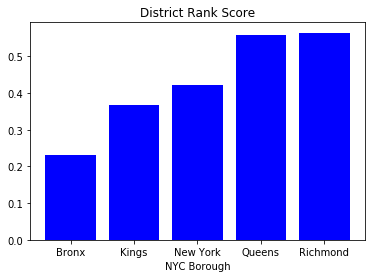

In [67]:
#Create x axis for bar graph
x_axis = np.arange(len(grouped_df))

# Create the ticks for our bar chart's x axis
tick_locations = [value+0.4 for value in x_axis]
plt.xticks(tick_locations, grouped_df["Borough List"])

#Create bar graph for teacher/student ratios
plt.bar(x_axis, grouped_df["Rank Score"], color="b", align="edge")

plt.title("District Rank Score")
plt.xlabel("NYC Borough")
plt.show()

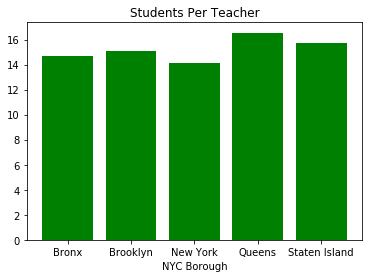

In [181]:
#Create x axis for bar graph
x_axis = np.arange(len(grouped_df))

# Create the ticks for our bar chart's x axis
tick_locations = [value+0.4 for value in x_axis]
plt.xticks(tick_locations, grouped_df["Borough List"])

#Create bar graph for teacher/student ratios
plt.bar(x_axis, grouped_df["Teacher to Student Ratio"], color="g", align="edge")

plt.title("Students Per Teacher")
plt.xlabel("NYC Borough")
plt.show()